# The predictive power of information state changes

## Get packages and JPMaQS data

In [2]:
# >>> Define constants <<< #
import os
import warnings
warnings.filterwarnings("ignore", "UserWarning")

# Minimum Macrosynergy package version required for this notebook
REQUIRED_VERSION: str = "0.1.32"

# DataQuery credentials: Remember to replace with your own client ID and secret
DQ_CLIENT_ID: str = os.getenv("DQ_CLIENT_ID")
DQ_CLIENT_SECRET: str = os.getenv("DQ_CLIENT_SECRET")

# Define any Proxy settings required (http/https)
PROXY = {}

# Start date for the data (argument passed to the JPMaQSDownloader class)
START_DATE: str = "1995-01-01"

In [3]:
# Check installed Macrosynergy package meets version requirement
import macrosynergy as msy
msy.check_package_version(required_version=REQUIRED_VERSION)

In [4]:
# Standard library imports
from typing import List, Tuple, Dict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.stats import chi2

# Macrosynergy package imports
import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv
import macrosynergy.signal as mss

from macrosynergy.download import JPMaQSDownload

### Specify and download the data

In [5]:
# Cross sections to be explored
cids_dm = ["AUD", "CAD", "CHF", "EUR", "GBP", "JPY", "NOK", "NZD", "SEK", "USD"]
cids_em = [
    "CLP",
    "COP",
    "CZK",
    "HUF",
    "IDR",
    "ILS",
    "INR",
    "KRW",
    "MXN",
    "PLN",
    "THB",
    "TRY",
    "TWD",
    "ZAR",
]
cids = cids_dm + cids_em

cids_wild = ["CNY", "HKD", "RON", "RUB", "SGD"]
cids_non_tradable = ["IDR", "NZD"]
cids_emx = sorted(list(set(cids_em) - set(cids_wild) - set(cids_non_tradable)))
cids_dmx = sorted(list(set(cids_dm) - set(cids_non_tradable)))
cids_du = sorted(cids_dmx + cids_emx)
cids_duxi = np.sort(list(set(cids_du) - set(["INR"])))

In [6]:
# Nested notebook of quantamental groups and categories

isc_feats = {
    "growth": {
        "RGDPTECH_SA_P1M1ML12": {
            "freq": "M",   # frequency of the underlying series
            "sign": "NEG",  # assumed direction of impact
            "desc": "Technical real GDP, %oya",  # label for charts and tables
        },
        "INTRGDP_NSA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Intuitive real GDP, %oya"
        },
        "IP_SA_P6M6ML6AR": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Industrial Production",
        },
        "RPCONS_SA_P1M1ML12": {
            "freq": "M", 
            "sign": "NEG",
            "desc": "Real Private Consumption (monthly)",
        },
        "RPCONS_SA_P1Q1QL4": {
            "freq": "Q",
            "sign": "NEG",
            "desc": "Real Private consumption (quarterly)",
        },
        "IMPORTS_SA_P6M6ML6AR": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Import growth",
        },
        "RRSALES_SA_P1M1ML12_3MMA": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Real retail sales"
        },
        "RRSALES_SA_P1Q1QL4": {
            "freq": "Q",
            "sign": "NEG",
            "desc": "Real retail sales"
        },
    },
    "inflation": {
        "CPIHX_SA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Headline consumer price inflation",
        },
        "CPICX_SA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Core consumer price inflation",
        },
        "PPIH_NSA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Producer Price Index %oya",
        },
    },
    "financial": {
        "PCREDITGDP_SJA_D1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Private credit as percent of GDP - changes",
        },
        "MNARROW_SJA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Narrow money yoy change",
        },
        "MBROAD_SJA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Broad money yoy change",
        },
        "IIPLIABGDP_NSA": {
            "freq": "Q",
            "sign": "NEG",
            "desc": "international investment position liabilities (ratio to GDP)",
        },
        "NIIPGDP_NSA": {
            "freq": "Q",
            "sign": "NEG",
            "desc": "Net international investment position (ratio to GDP)",
        },
    },
    "labour": {
        "UNEMPLRATE_SA_3MMA": {
            "freq": "M",
            "sign": "POS",
            "desc": "Unemployment rate",
        },
        "EMPL_NSA_P1M1ML12": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Employment growth"
        },
        "EMPL_NSA_P1Q1QL4": {
            "freq": "Q",
            "sign": "NEG",
            "desc": "Employment growth",
        },
    },
    "surveys": {
        "MBCSCORE_SA": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Manufacturing confidence scores",
        },
        "SBCSCORE_SA": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Service confidence scores",
        },
        "CBCSCORE_SA": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Construction confidence score "
        },
        "CCSCORE_SA": {
            "freq": "M",
            "sign": "NEG",
            "desc": "Consumer confidence score "
        }
    },
}

In [7]:
# Dictionary of indicators by frequency

pe_freqs = {
    ff: [
        k + "_" + v["sign"]
        for cats in isc_feats.values()
        for k, v in cats.items()
        if v["freq"] == ff
    ]
    for ff in ("D", "W", "M", "Q")
}

# Lists of categories by frequency for scaling to volatility

daily = pe_freqs["D"]
weekly = pe_freqs["W"]
monthly = pe_freqs["M"]
quarterly = pe_freqs["Q"]

In [8]:
# Modify tickers to include the sign in the name

pe_growth = [xc + "_" + v["sign"] for xc, v in isc_feats["growth"].items()]
pe_inflation = [xc + "_" + v["sign"] for xc, v in isc_feats["inflation"].items()]
pe_financial = [xc + "_" + v["sign"] for xc, v in isc_feats["financial"].items()]
pe_labour = [xc + "_" + v["sign"] for xc, v in isc_feats["labour"].items()]
pe_surveys = [xc + "_" + v["sign"] for xc, v in isc_feats["surveys"].items()]

pe_feats = pe_growth + pe_inflation + pe_financial + pe_labour + pe_surveys

In [9]:
# Category ticker lists for download

main = [
    xc for cats in isc_feats.values() for xc in cats.keys()
    if xc not in ("CPIHX_SA_P1M1ML12", "CPICX_SA_P1M1ML12")
] + [
    "CPIH_SA_P1M1ML12", "CPIHE_SA_P1M1ML12",
    "CPIC_SA_P1M1ML12", "CPICE_SA_P1M1ML12",
]
misc = ["USDGDPWGT_SA_3YMA", "EXMOPENNESS_NSA_1YMA", "EXALLOPENNESS_NSA_1YMA"]
mark = ["DU05YXR_VT10", "DU05YXR_NSA"]

xcats = main + mark + misc

# Construct tickers
tickers: List[str] = [
    cid + "_" + xcat
    for cid in cids
    for xcat in xcats
]
print(f"Maximum number of JPMaQS tickers to be downloaded is {len(tickers)}")

Maximum number of JPMaQS tickers to be downloaded is 720


In [10]:
# Download series from J.P. Morgan DataQuery by tickers

with JPMaQSDownload(
    client_id=DQ_CLIENT_ID, client_secret=DQ_CLIENT_SECRET, proxy=PROXY
) as downloader:
    df: pd.DataFrame = downloader.download(
        tickers=tickers,
        start_date=START_DATE,
        metrics=["value", "eop_lag"],  # TODO use mop_lag for time temporal weights (together with eop)
        suppress_warning=True,
        show_progress=True,
        report_time_taken=True,
    )

Timestamp UTC:  2024-10-29 10:42:25
Connection successful!


Requesting data: 100%|██████████| 72/72 [00:15<00:00,  4.79it/s]


Time taken to download data: 	51.17 seconds.
Some expressions are missing from the downloaded data. Check logger output for complete list.
268 out of 1440 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 7784 dates are missing.


In [11]:
# Deep copy and fill
dfx = df.copy()
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3962870 entries, 0 to 3962869
Data columns (total 5 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
 4   eop_lag    float64       
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 151.2+ MB


### Blacklist dictionary 

In [12]:
dublack = {"TRY": (pd.Timestamp("2020-01-01 00:00:00"), pd.Timestamp("2100-01-01 00:00:00"))}

### Availability

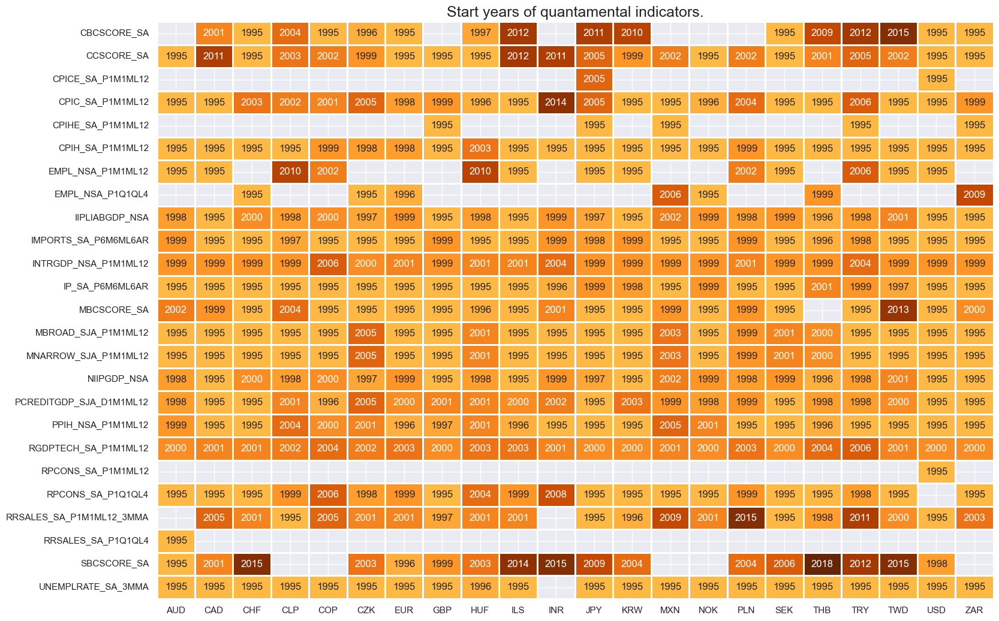

In [13]:
msm.check_availability(df=df, xcats=main, cids=cids_du, missing_recent=False)

## Transformations and checks

### Extended best CPI changes through hierarchical merging 

In [14]:
# Dictionary for merged core CPI and hierarchies of merged constituents
dict_cpicx = {
    "CPICX_" + chg: [cpi + chg for cpi in ["CPICE_", "CPIC_"]]
    for chg in ["SA_P1M1ML12"]
}

# Dictionary for merged headline CPI and hierarchies of merged constituents
dict_cpihx = {
    "CPIHX_" + chg: [cpi + chg for cpi in ["CPIHE_", "CPIH_"]]
    for chg in ["SA_P1M1ML12"]
}

# Merge dictionary of new tickers and hierarchies of merged constituents
dict_cpix = {**dict_cpicx, **dict_cpihx}

store = [
    msm.merge_categories(dfx, xcats=v, new_xcat=k)
    for k, v in dict_cpix.items()
]

dfx = msm.update_df(dfx, pd.concat(store, axis=0, ignore_index=True))

### Explicit positive and negative impact categories

In [15]:
dfa = dfx[dfx['xcat'].isin([xc[:-4] for xc in pe_feats if xc[-3:] == "NEG"])].copy()
dfa.loc[:, 'value'] = dfa['value'] * -1
dfa.loc[:, 'xcat'] = dfa['xcat']  + "_NEG"
dfx = msm.update_df(dfx, dfa)

dfa = dfx[dfx['xcat'].isin([xc[:-4] for xc in pe_feats if xc[-3:] == "POS"])].copy()
dfa.loc[:, 'xcat'] = dfa['xcat']  + "_POS"
dfx = msm.update_df(dfx, dfa)

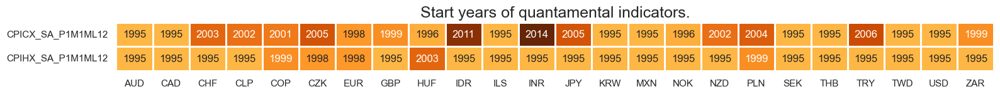

In [16]:
# Check availability of new tickers

xcatx = [k for k in dict_cpix.keys()]
msm.check_availability(dfx, xcats = xcatx, cids=cids, missing_recent=False)

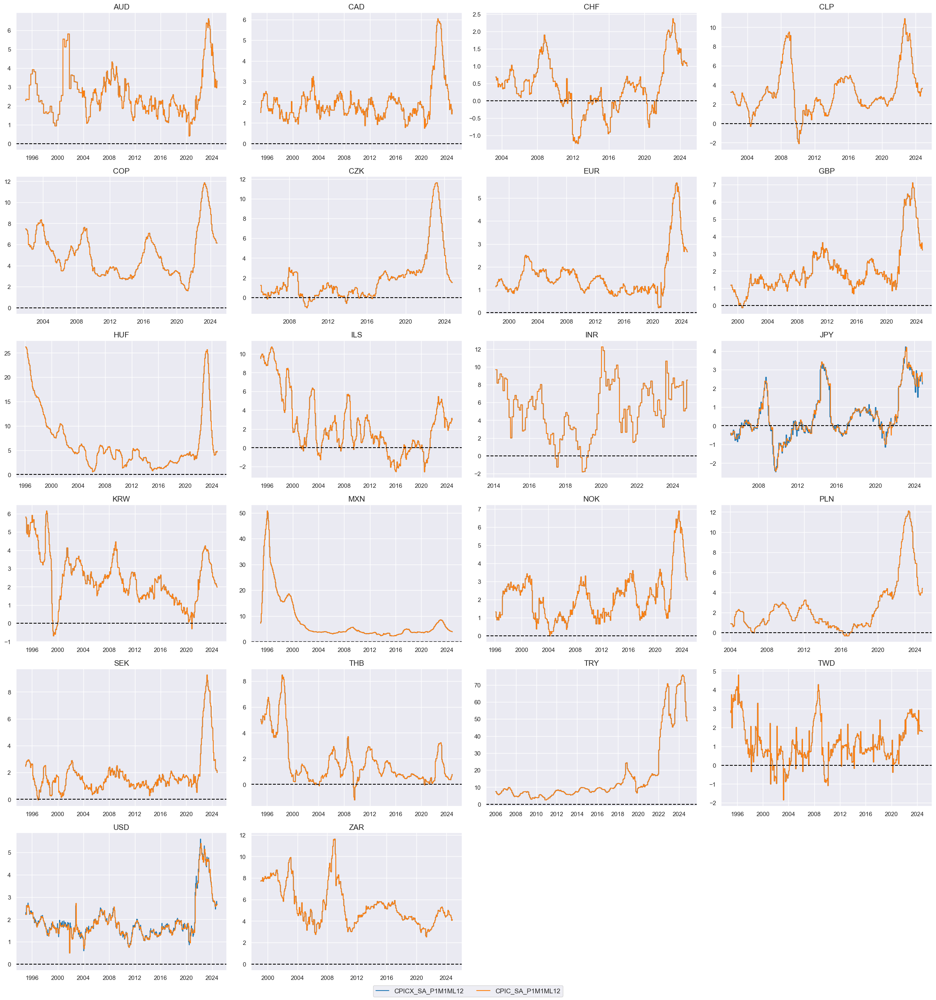

In [17]:
# Compare original and extended measures

xcatx = ["CPICX_SA_P1M1ML12", "CPIC_SA_P1M1ML12"]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start="1990-01-01",
    same_y=False,
    all_xticks=True,
    title =None,
    title_fontsize=28,
    aspect=1.4,
    size=(8, 8),
)

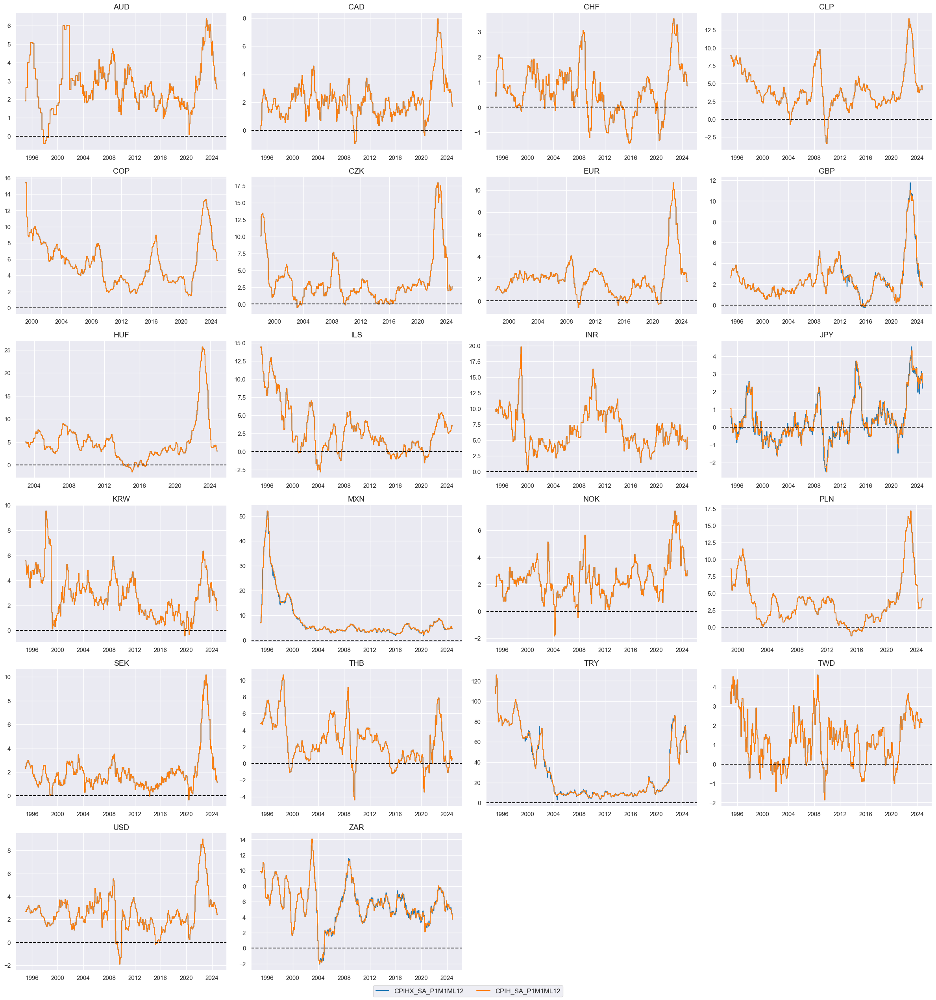

In [18]:
# Compare original and extended measures

xcatx = ["CPIHX_SA_P1M1ML12", "CPIH_SA_P1M1ML12"]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start="1990-01-01",
    same_y=False,
    all_xticks=True,
    title =None,
    title_fontsize=28,
    aspect=1.4,
    size=(8, 8),
)

### Normalized information changes in annualized change units

In [19]:
df_red = msm.reduce_df(dfx, xcats=pe_feats, cids=cids_du)

# creates sparse dataframe with information state changes
isc_obj = msm.InformationStateChanges.from_qdf(
    df=df_red,
    norm=True,  # normalizes changes by first release values
    std="std",
    halflife=36,  # for volatility scaling only
    min_periods=36,
)

dfa = isc_obj.to_qdf(value_column="zscore", postfix="_NIC")
dfx = msm.update_df(dfx, dfa[["real_date", "cid", "xcat", "value"]])

In [20]:
# Information state changes in standard annualized change units

store = []
weights = [
    (pe_freqs["D"], np.sqrt(1/262)),  # annualization factors for random walks
    (pe_freqs["W"], np.sqrt(1/52)), 
    (pe_freqs["M"], np.sqrt(1/12)), 
    (pe_freqs["Q"], np.sqrt(1/4)),
]

for xcats, w in weights:
    _tmp = msm.reduce_df(dfx, xcats=[x + "_NIC" for x in xcats])
    _tmp["value"] *= w
    _tmp["xcat"] += "A"
    store.append(_tmp[["real_date", "cid", "xcat", "value"]].dropna())

dfa = pd.concat(store, axis=0, ignore_index=True)
dfx = msm.update_df(dfx, dfa)

### Winsorized information changes

In [21]:
# Winsorization 3 annual information state changes for any given release date
xcatx = [xc + "_NICA" for xc in pe_feats]
cidx = cids_du

dfa = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
dfa["value"] = dfa["value"].clip(lower=-3, upper=3)
dfa["xcat"] += "W"

dfx = msm.update_df(dfx, dfa[["real_date", "cid", "xcat", "value"]].dropna())

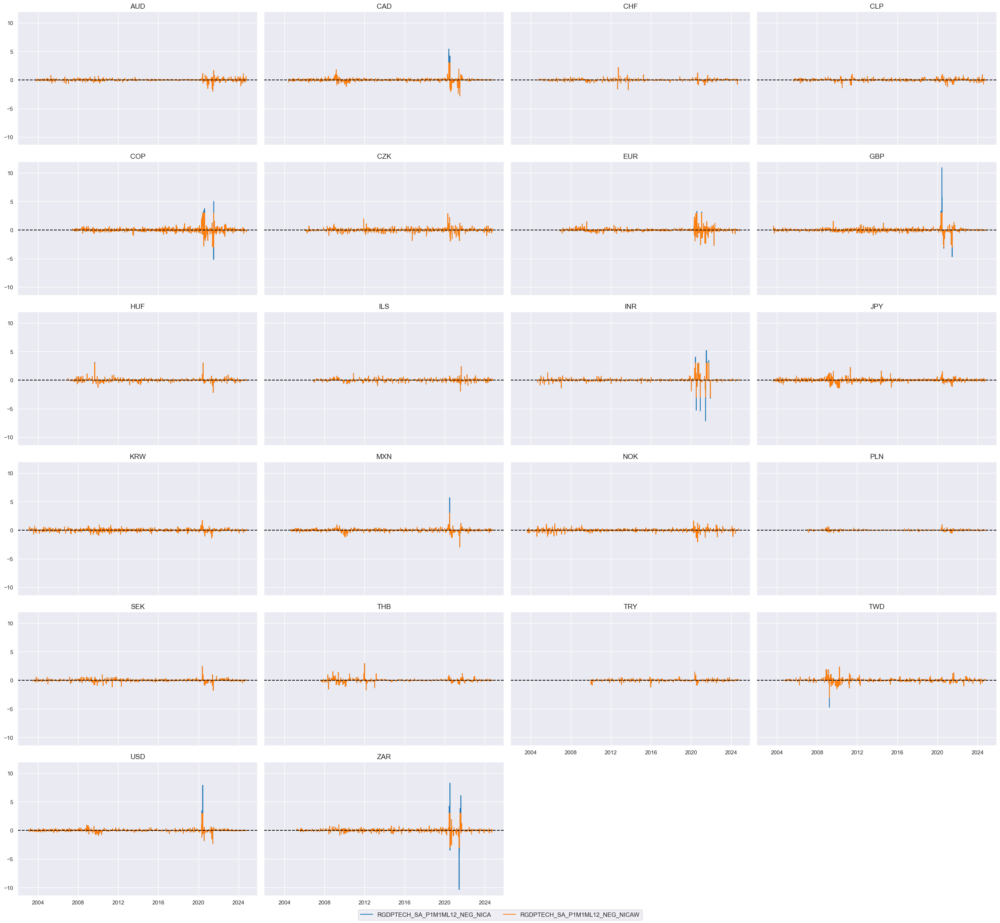

In [22]:
xcatx = ['RGDPTECH_SA_P1M1ML12_NEG_NICA','RGDPTECH_SA_P1M1ML12_NEG_NICAW',]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    title=None,
    same_y=True,
)

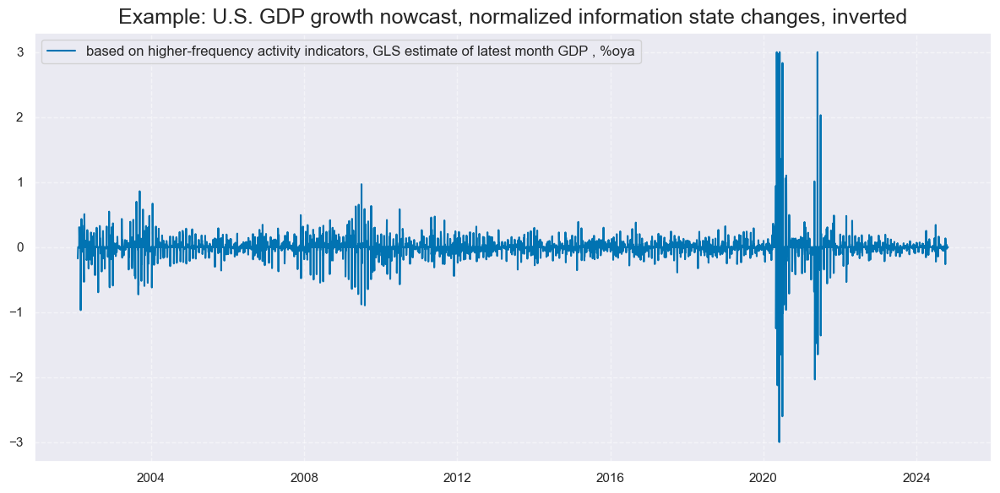

In [23]:
xcatx = ['INTRGDP_NSA_P1M1ML12_NEG_NICAW']
cidx = ["USD"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=1,
    start="2000-01-01",
    title="Example: U.S. GDP growth nowcast, normalized information state changes, inverted",
    xcat_labels=["based on higher-frequency activity indicators, GLS estimate of latest month GDP , %oya"],
    size=(12, 6),
)

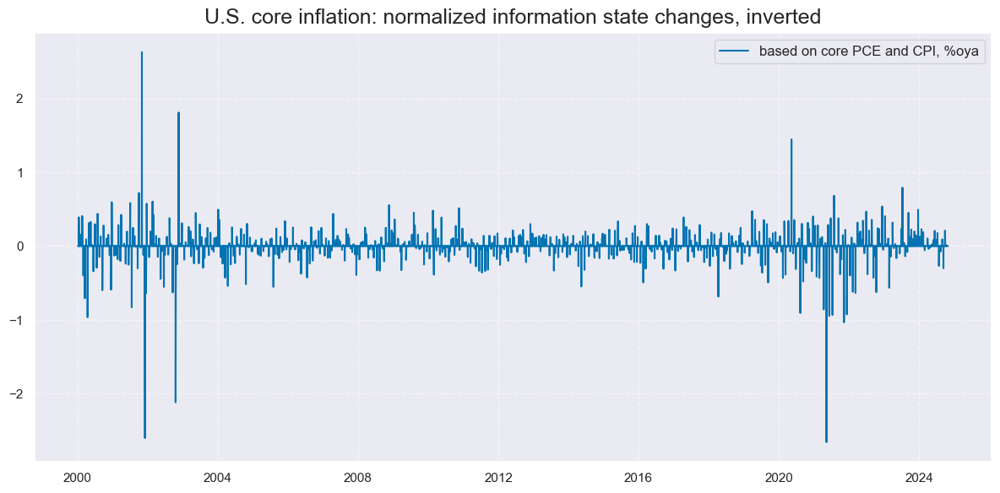

In [24]:
xcatx = ['CPICX_SA_P1M1ML12_NEG_NICAW']
cidx = ["USD"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=1,
    start="2000-01-01",
    title="U.S. core inflation: normalized information state changes, inverted",
    xcat_labels=["based on core PCE and CPI, %oya"],
    size=(12, 6),
)

### Moving averages of information changes

In [25]:
xcatx = [xc + "_NICAW" for xc in pe_feats]
cidx = cids_du
hts=[5, 3]  # Half-times

dfa = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
dfa["ticker"] = dfa["cid"] + "_" + dfa["xcat"]
p = dfa.pivot(index="real_date", columns="ticker", values="value")

store = []
for ht in hts:
    proll = p.ewm(halflife=ht).sum()
    proll.columns += f"_{ht}DXMS"
    _df = proll.stack().to_frame("value").reset_index()
    _df[["cid", "xcat"]] = _df["ticker"].str.split("_", n=1, expand=True)
    store.append(_df[["cid", "xcat", "real_date", "value"]])
    
dfx = msm.update_df(dfx, pd.concat(store, axis=0, ignore_index=True))
tranx = [f"_NICAW_{ht}DXMS" for ht in hts]

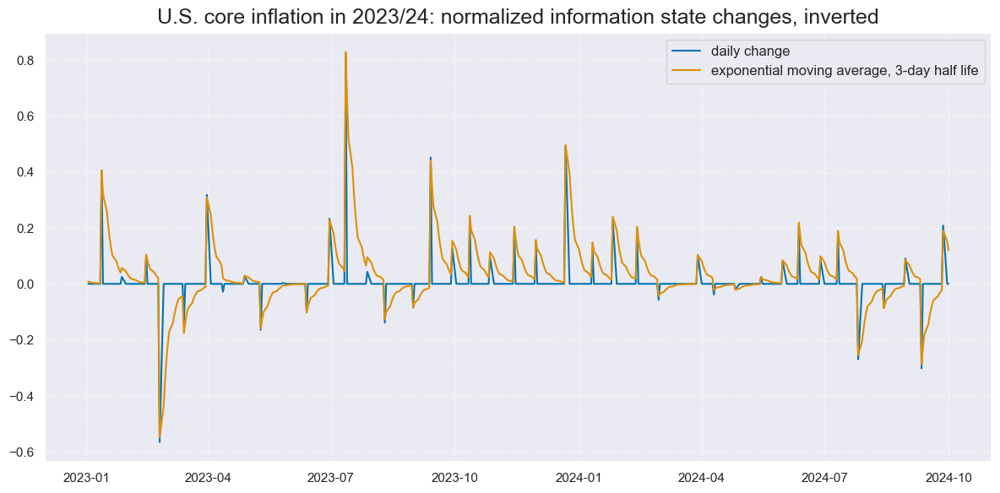

In [26]:
xcatx = ['CPICX_SA_P1M1ML12_NEG_NICAW', "CPICX_SA_P1M1ML12_NEG_NICAW_3DXMS"]
cidx = ["USD"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=1,
    start="2023-01-01",
    end="2024-10-01",
    title="U.S. core inflation in 2023/24: normalized information state changes, inverted",
    xcat_labels=["daily change", "exponential moving average, 3-day half life"],
    size=(12, 6),
)

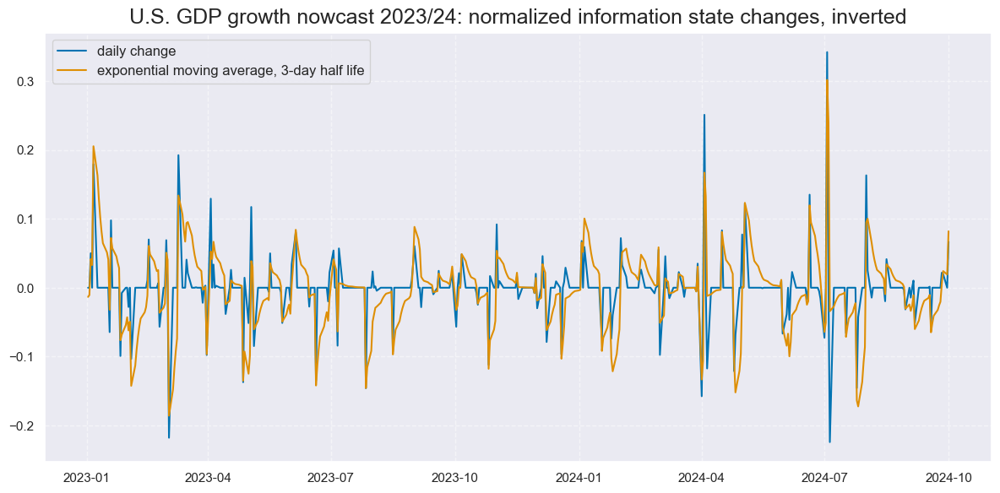

In [27]:
xcatx = ['INTRGDP_NSA_P1M1ML12_NEG_NICAW', "INTRGDP_NSA_P1M1ML12_NEG_NICAW_3DXMS"]
cidx = ["USD"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=1,
    start="2023-01-01",
    end="2024-10-01",
    title="U.S. GDP growth nowcast 2023/24: normalized information state changes, inverted",
    xcat_labels=["daily change", "exponential moving average, 3-day half life"],
    size=(12, 6),
)

### Group aggregation

#### Growth

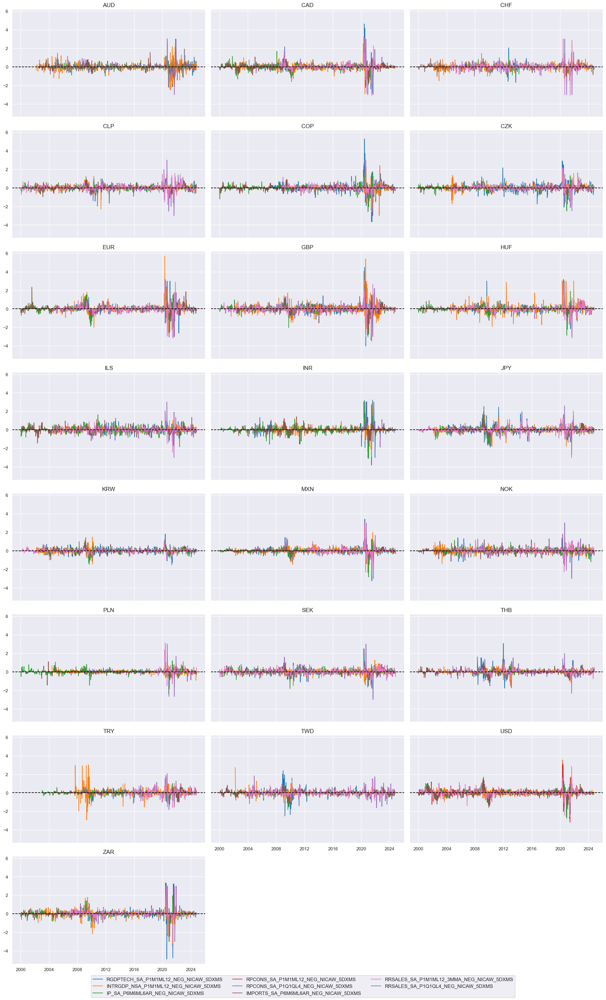

In [28]:
trans = tranx[0]
xcatx = [xc + trans for xc in pe_growth]

cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    title=None,
    same_y=True,
)

In [ ]:
cidx = cids_du

dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)

for trans in tranx:
    xcatx = [xc + trans for xc in pe_growth]
    dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
    dfa = msp.linear_composite(
        df=dfr,
        xcats=xcatx,
        cids=cidx,
        new_xcat="GROWTH" + trans,
    )
    dfx = msm.update_df(dfx, dfa)

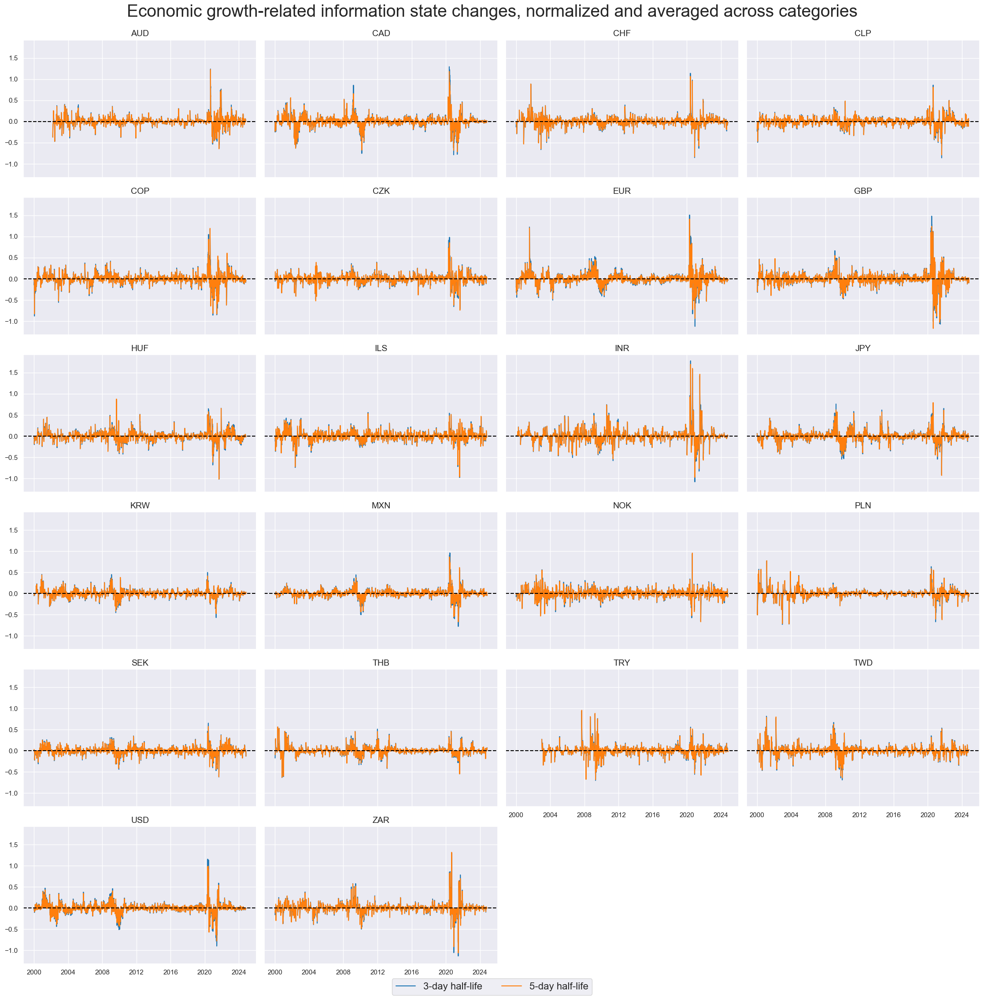

In [30]:
xcatx = ["GROWTH" + trans for trans in tranx]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    aspect = 1.5,
    height=2.5,
    title="Economic growth-related information state changes, normalized and averaged across categories",
    title_fontsize=28,
    xcat_labels=["3-day half-life", "5-day half-life"],
    legend_fontsize=16,
    same_y=True,
)

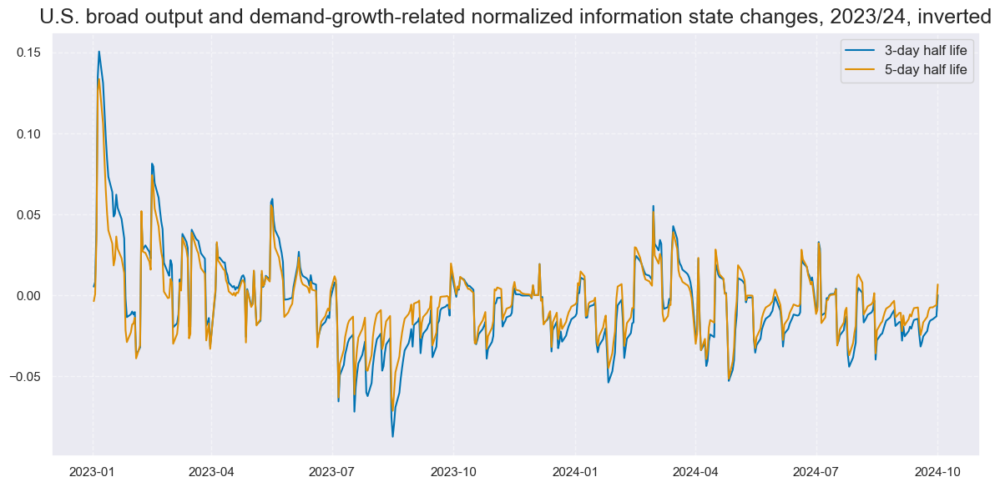

In [31]:
xcatx = ["GROWTH" + trans for trans in tranx]
cidx = ["USD"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=1,
    start="2023-01-01",
    end="2024-10-01",
    title="U.S. broad output and demand-growth-related normalized information state changes, 2023/24, inverted",
    xcat_labels=["3-day half life", "5-day half life"],
    size=(12, 6),
)

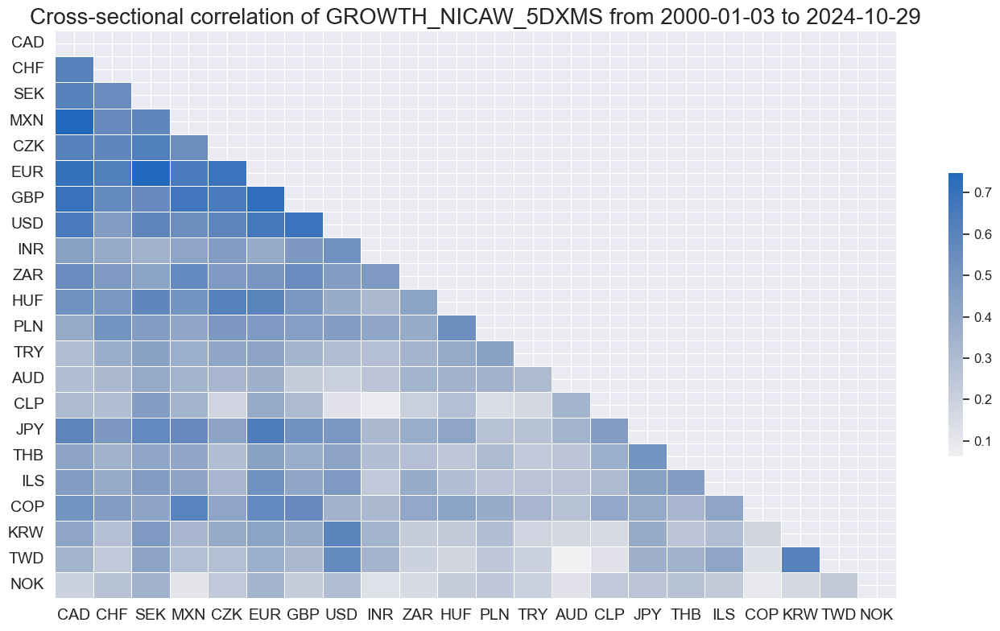

In [32]:
msp.correl_matrix(
    dfx,
    xcats=["GROWTH" + tranx[0]],
    cids=cids_du,
    start="2000-01-01",
    cluster=True,
    freq="M",
)

#### Inflation

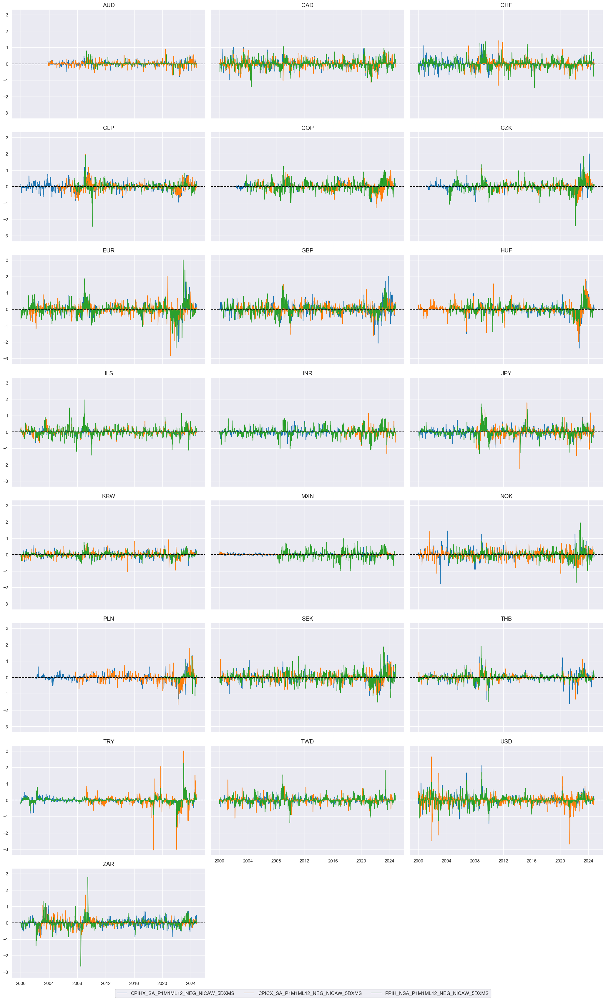

In [33]:
trans = "_NICAW_5DXMS"
xcatx = [xc + trans for xc in pe_inflation]

cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    title=None,
    same_y=True,
)

In [34]:
cidx = cids_du

dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)

for trans in tranx:
    xcatx = [xc + trans for xc in pe_inflation]
    dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
    dfa = msp.linear_composite(
        df=dfr,
        xcats=xcatx,
        cids=cidx,
        new_xcat="INFLATION" + trans,
    )
    dfx = msm.update_df(dfx, dfa)

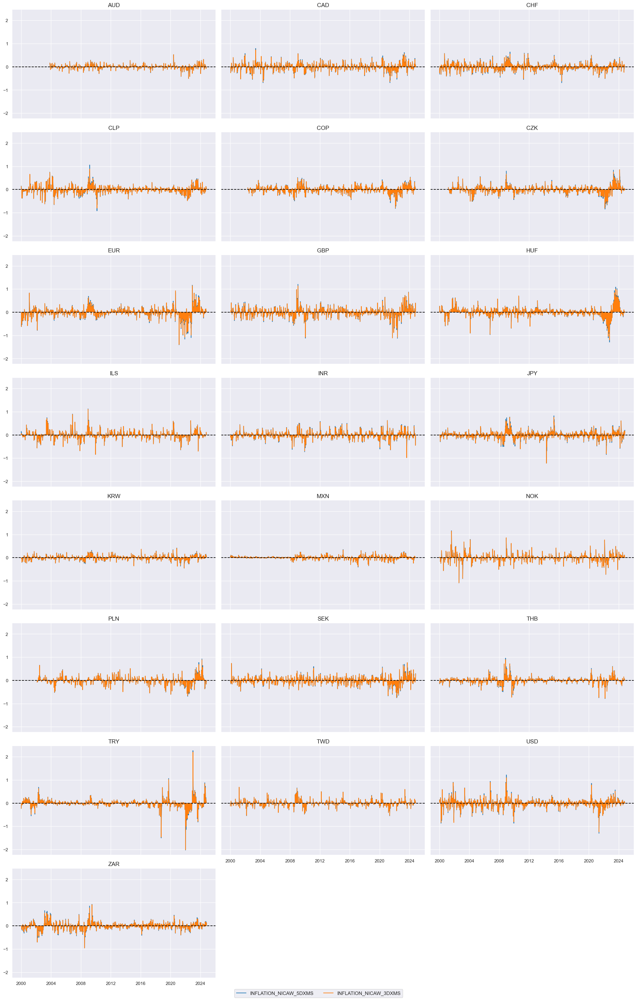

In [35]:
xcatx = ["INFLATION" + trans for trans in tranx]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    aspect = 1.7,
    title=None,
    same_y=True,
)

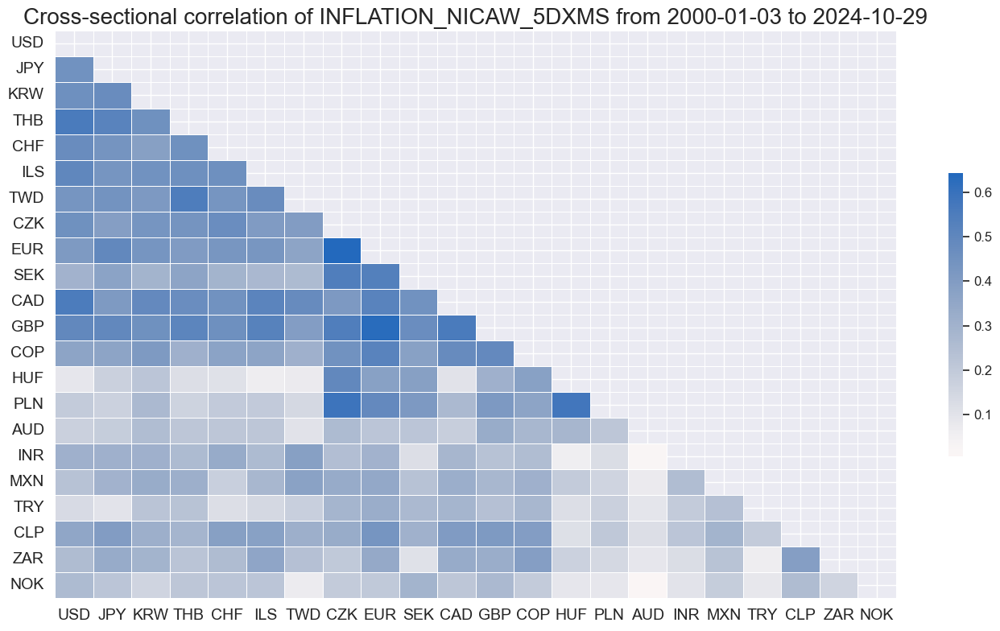

In [36]:
msp.correl_matrix(
    dfx,
    xcats=["INFLATION" + tranx[0]],
    cids=cids_du,
    start="2000-01-01",
    cluster=True,
    freq="M",
)

#### Financial

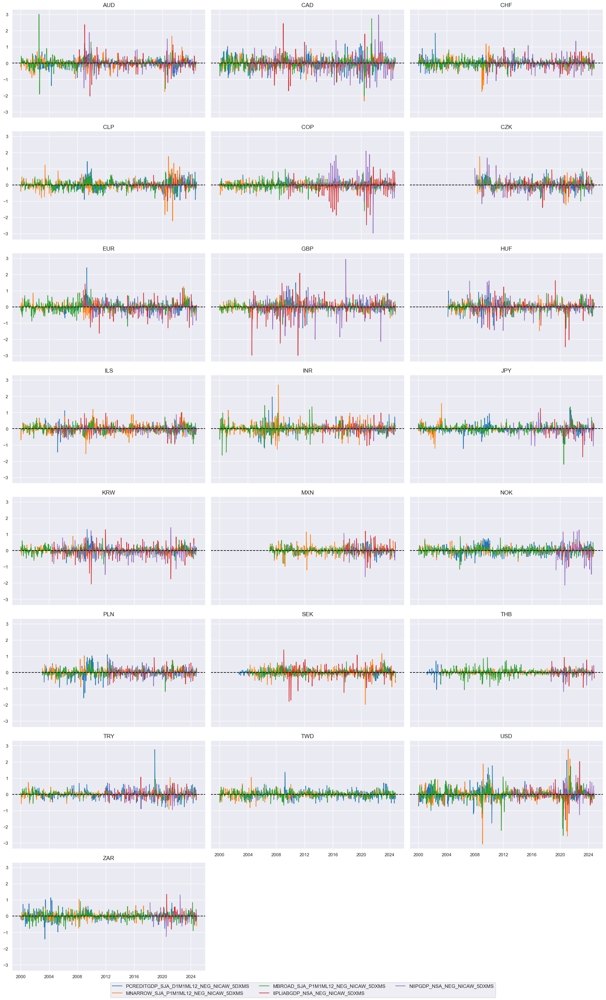

In [37]:
trans = tranx[0]
xcatx = [xc + trans for xc in pe_financial]

cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    title=None,
    same_y=True,
)

In [38]:
warnings.filterwarnings("ignore")
cidx = cids_du

dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)

for trans in tranx:
    xcatx = [xc + trans for xc in pe_financial]
    dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
    dfa = msp.linear_composite(
        df=dfr,
        xcats=xcatx,
        cids=cidx,
        new_xcat="FINANCIAL" + trans,
    )
    dfx = msm.update_df(dfx, dfa)

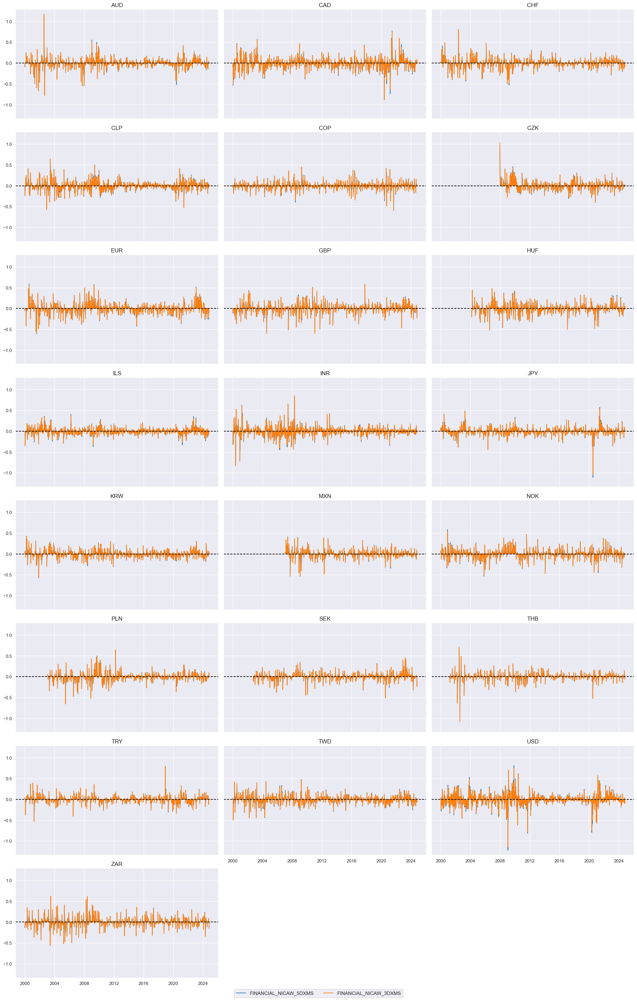

In [39]:
xcatx = ["FINANCIAL" + trans for trans in tranx]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    aspect = 1.7,
    title=None,
    same_y=True,
)

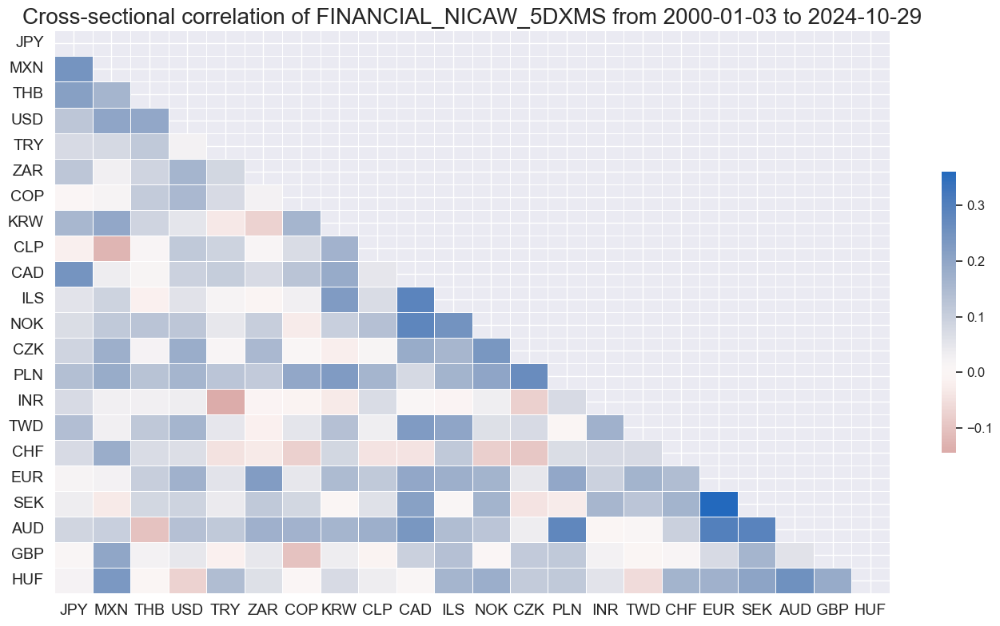

In [40]:
msp.correl_matrix(
    dfx,
    xcats=["FINANCIAL" + tranx[0]],
    cids=cids_du,
    start="2000-01-01",
    cluster=True,
    freq="M",
)

#### Labour

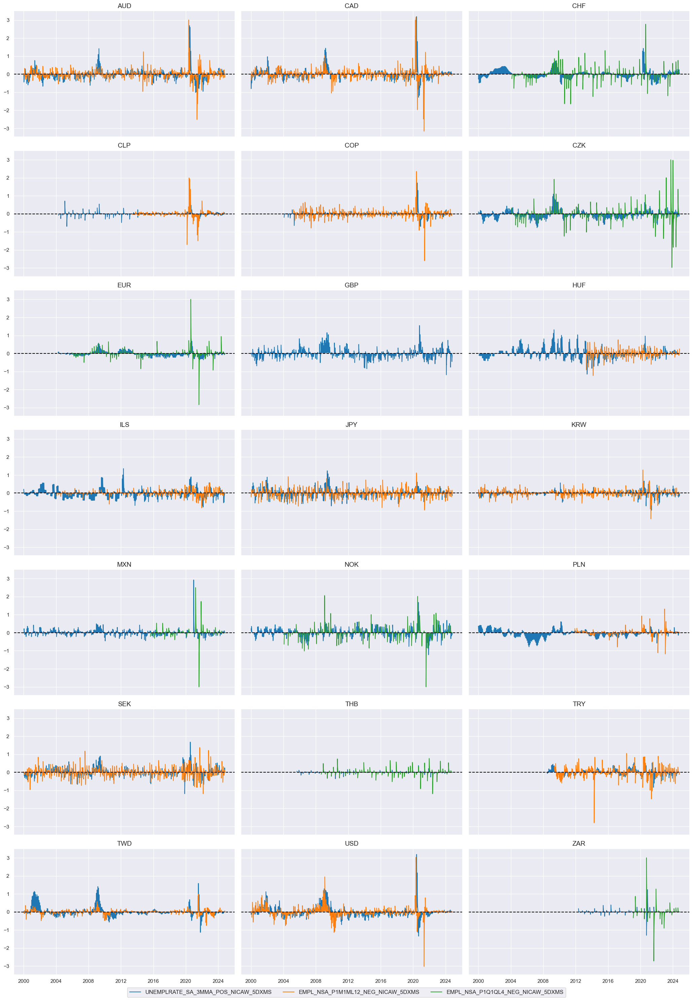

In [41]:
trans = tranx[0]
xcatx = [xc + trans for xc in pe_labour]

cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    title=None,
    same_y=True,
)

In [42]:
cidx = cids_duxi

dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)

for trans in tranx:
    xcatx = [xc + trans for xc in pe_labour]
    dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
    dfa = msp.linear_composite(
        df=dfr,
        xcats=xcatx,
        cids=cidx,
        new_xcat="LABOUR" + trans,
    )
    dfx = msm.update_df(dfx, dfa)

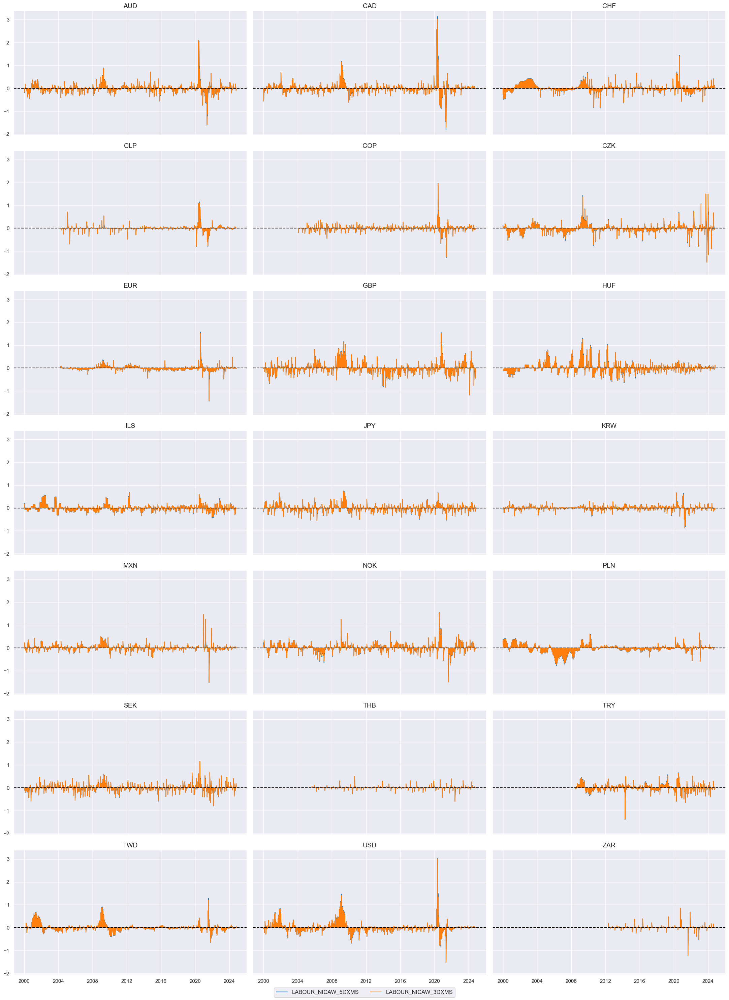

In [43]:
xcatx = ["LABOUR" + trans for trans in tranx]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    aspect = 1.7,
    title=None,
    same_y=True,
)

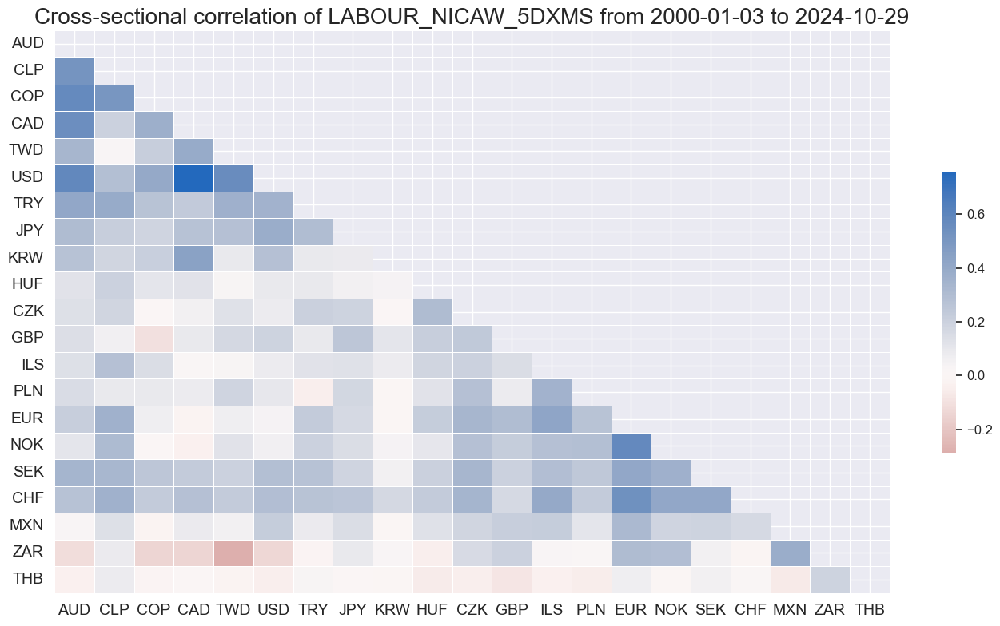

In [44]:
msp.correl_matrix(
    dfx,
    xcats=["LABOUR" + tranx[0]],
    cids=cids_du,
    start="2000-01-01",
    cluster=True,
    freq="M",
)

#### Surveys

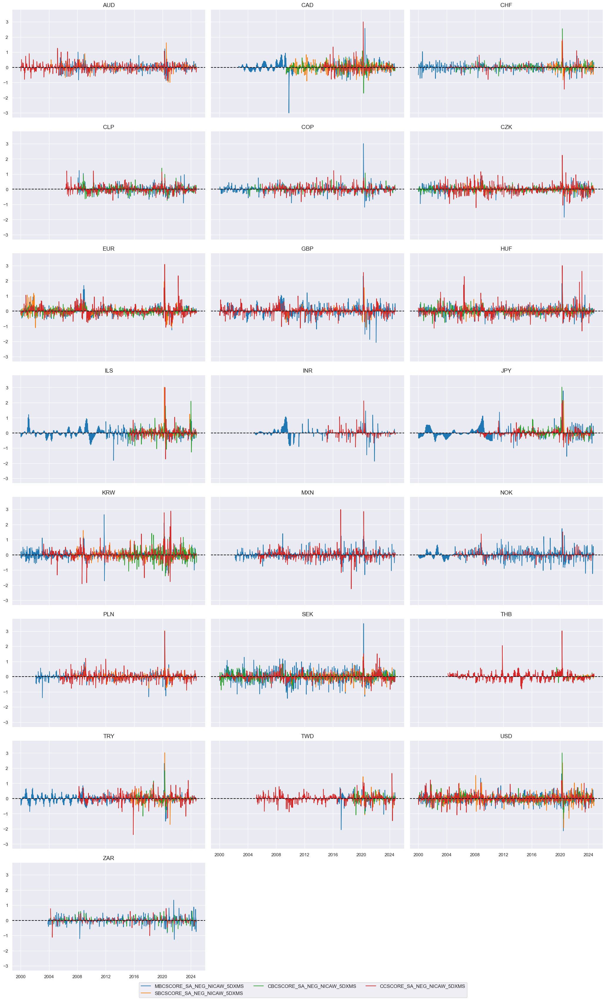

In [45]:
trans = tranx[0]
xcatx = [xc + trans for xc in pe_surveys]

cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    title=None,
    same_y=True,
)

In [46]:
cidx = cids_du

dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)

for trans in tranx:
    xcatx = [xc + trans for xc in pe_surveys]
    dfr = msm.reduce_df(dfx, xcats=xcatx, cids=cidx)
    dfa = msp.linear_composite(
        df=dfr,
        xcats=xcatx,
        cids=cidx,
        new_xcat="SURVEYS" + trans,
    )
    dfx = msm.update_df(dfx, dfa)

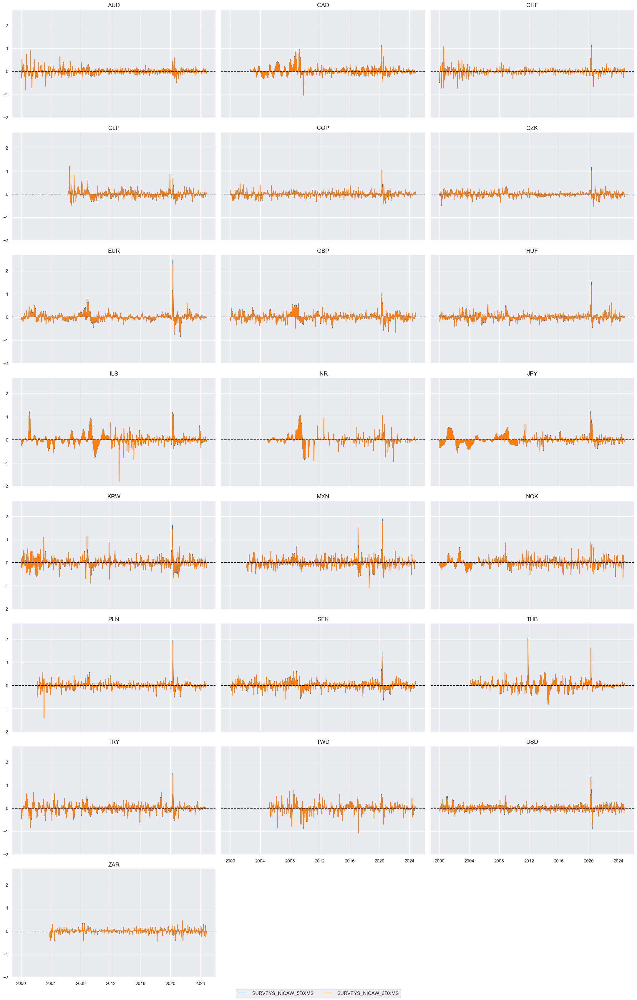

In [47]:
xcatx = ["SURVEYS" + trans for trans in tranx]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    aspect = 1.7,
    title=None,
    same_y=True,
)

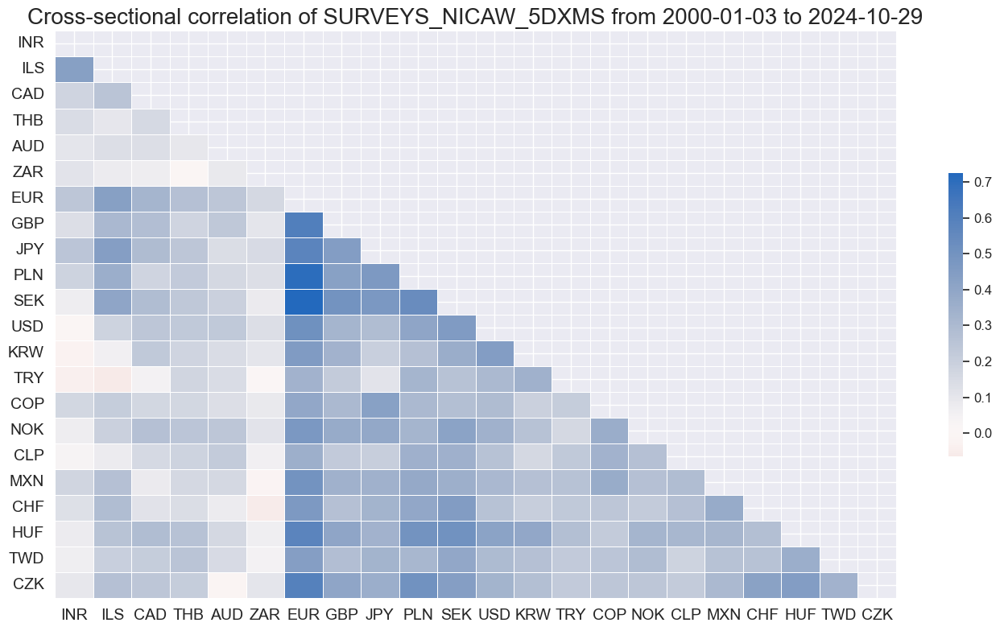

In [48]:
msp.correl_matrix(
    dfx,
    xcats=["SURVEYS" + tranx[0]],
    cids=cids_du,
    start="2000-01-01",
    cluster=True,
    freq="M",
)

### Cross-group aggregation

In [49]:
cidx = cids_du
groups = ["GROWTH", "INFLATION", "FINANCIAL", "LABOUR", "SURVEYS"]

for trans in tranx:
    xcatx = [g + trans for g in groups]
    dfa = msp.linear_composite(
        df=dfx,
        xcats=xcatx,
        cids=cidx,
        new_xcat="ALL" + trans,
    )
    dfx = msm.update_df(dfx, dfa)

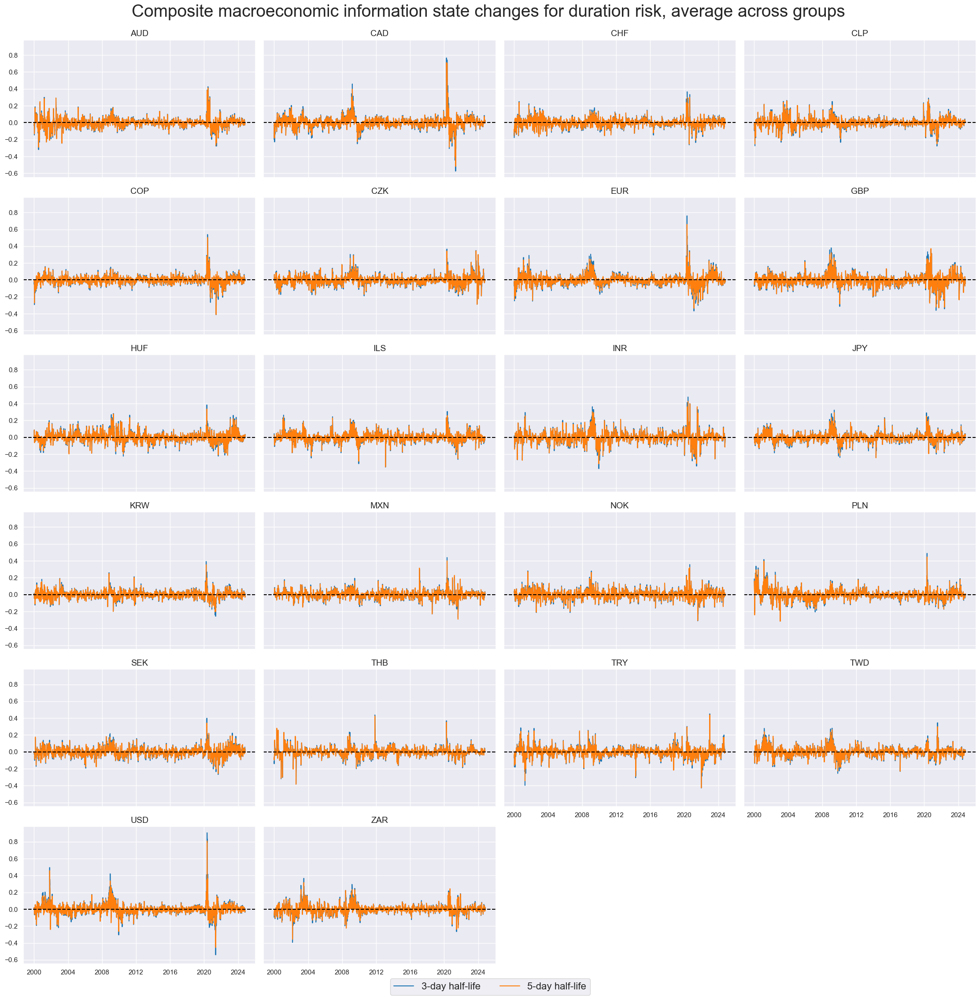

In [50]:
xcatx = ["ALL" + trans for trans in tranx]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    aspect = 1.5,
    height=2.5,
    title="Composite macroeconomic information state changes for duration risk, average across groups",
    title_fontsize=28,
    xcat_labels=["3-day half-life", "5-day half-life"],
    legend_fontsize=16,
    same_y=True,
)

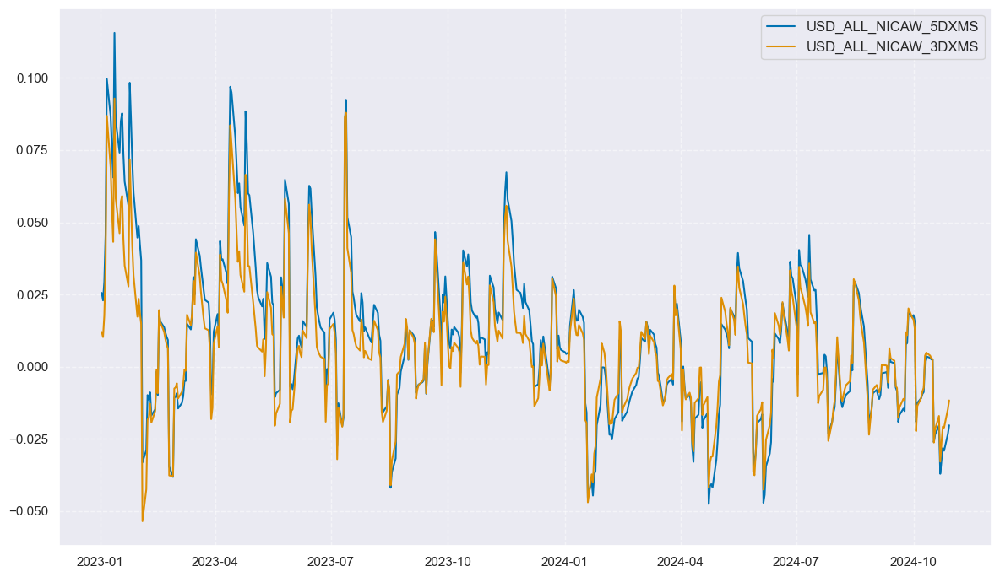

In [51]:
xcatx = ["ALL" + trans for trans in tranx]
cidx = ["USD"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=1,
    start="2023-01-01",
    aspect = 1.7,
    title=None,
    same_y=True,
)

### Global information state changes

In [52]:
groups = ["GROWTH", "INFLATION", "FINANCIAL", "LABOUR", "SURVEYS", "ALL"]

xcats = [group + trans for trans in tranx for group in groups]
dfr = msm.reduce_df(dfx, xcats=xcats + ["USDGDPWGT_SA_3YMA"], cids=cids_du)
store = []
for group in groups:
    for trans in tranx:
        xc = group + trans
        dfa = msp.linear_composite(
            dfr,
            xcats=xc,
            cids=cids_duxi if group == "LABOUR" else cids_du,
            weights="USDGDPWGT_SA_3YMA",
            new_cid="GLB",
            complete_cids=False,
        )
        store.append(dfa)

dfx = msm.update_df(dfx, pd.concat(store, axis=0, ignore_index=True).dropna())

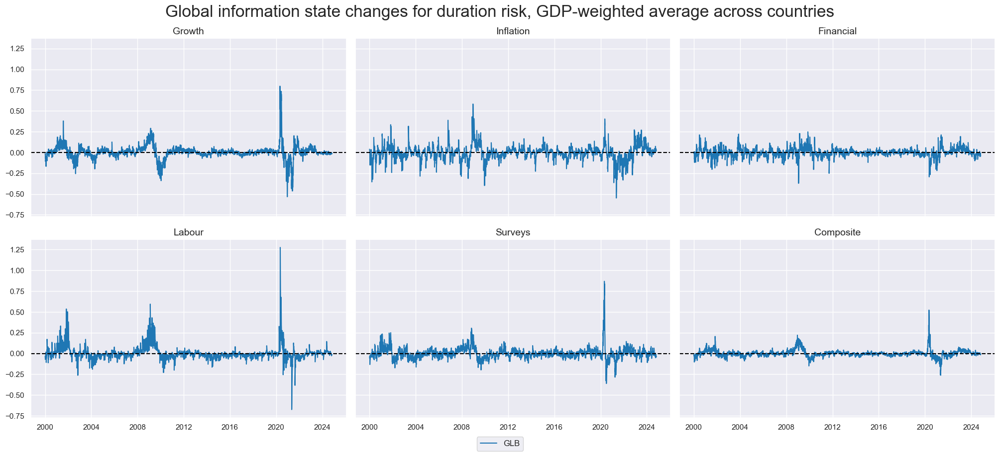

In [53]:
xcatx = [g + tranx[0] for g in groups]
group_labels = ["Growth", "Inflation", "Financial", "Labour", "Surveys", "Composite"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=["GLB"],
    xcat_grid=True,
    ncol=3,
    start="2000-01-01",
    aspect = 1.5,
    height=3,
    same_y=True,
    title="Global information state changes for duration risk, GDP-weighted average across countries",
    title_fontsize=24,
    xcat_labels=group_labels
)

### Average local-global information state changes

In [54]:
cidx = cids_du
calcs = []

for g in groups:
    for trans in tranx:
        calcs += [
            f"{g}{trans}_LG = 0.5 * ( {g}{trans} + iGLB_{g}{trans} )"
        ]

dfa = msp.panel_calculator(dfx, calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

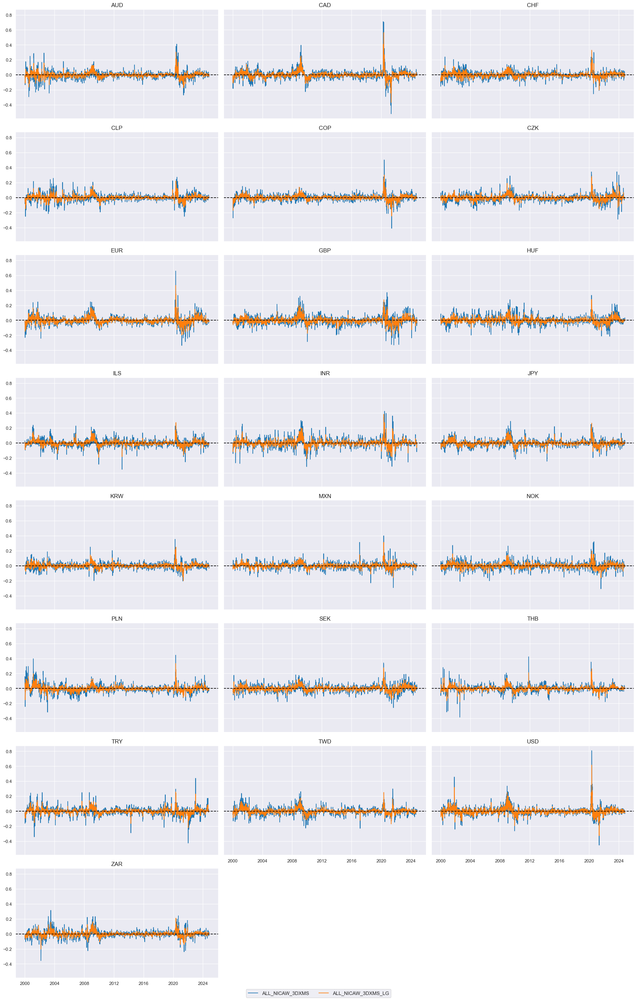

In [55]:
xc = "ALL" + tranx[1]
xcatx = [xc,  xc + "_LG"]
cidx = cids_du

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    start="2000-01-01",
    aspect = 1.7,
    title=None,
    same_y=True,
)

## Value checks

### Local signals

#### Specs and panel test

In [56]:
groups_ordered = ["ALL", "GROWTH", "LABOUR", "SURVEYS", "INFLATION", "FINANCIAL"]
glabels_ordered = ["Composite", "Growth", "Labour", "Surveys", "Inflation", "Financial"]
ics = [g + tranx[1] for g in groups_ordered]
display(ics)


['ALL_NICAW_3DXMS',
 'GROWTH_NICAW_3DXMS',
 'LABOUR_NICAW_3DXMS',
 'SURVEYS_NICAW_3DXMS',
 'INFLATION_NICAW_3DXMS',
 'FINANCIAL_NICAW_3DXMS']

In [57]:
dict_local = {
    "sigs": ics,
    "targs": ["DU05YXR_NSA", "DU05YXR_VT10",],
    "cidx": cids_du,
    "start": "2000-01-01",
    "black": dublack,
    "srr": None,
    "pnls": None,
}

LABOUR_NICAW_3DXMS misses: ['INR'].


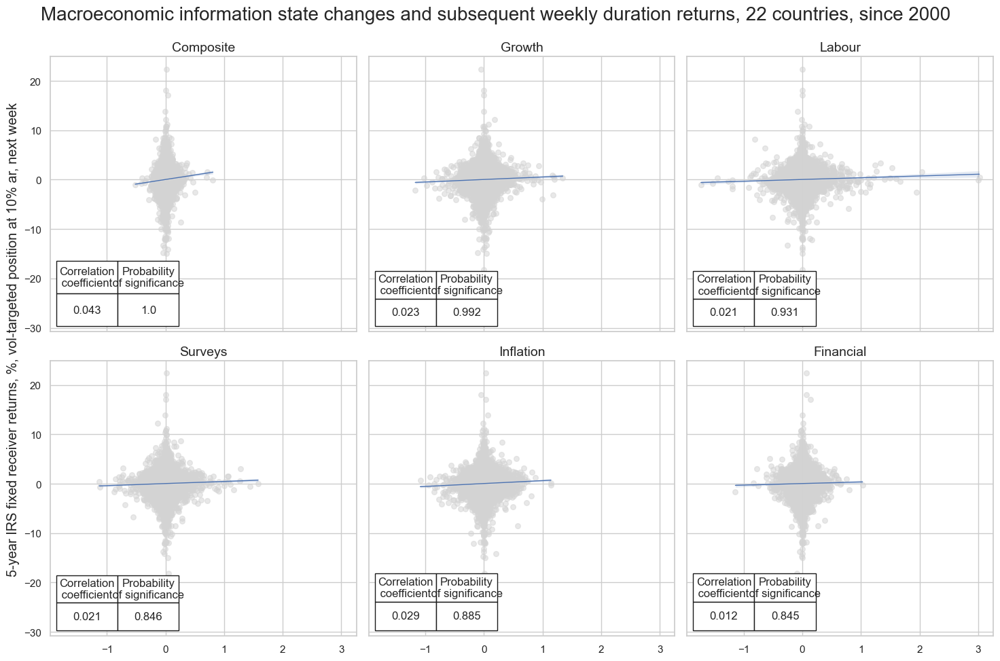

In [58]:
dix = dict_local

sigs = dix["sigs"]
targ = dix["targs"][1] 
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="W",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Macroeconomic information state changes and subsequent weekly duration returns, 22 countries, since 2000",
    ylab="5-year IRS fixed receiver returns, %, vol-targeted position at 10% ar, next week",
    ncol=3,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=glabels_ordered,
)

#### Accuracy and correlation check

In [59]:
dix = dict_local

sigx = dix["sigs"]
targx = [dix["targs"][1]]
cidx = dix["cidx"]
start = dix["start"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    sig_neg=[False] * len(sigx),
    freqs="D",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [60]:
dix = dict_local
srr = dix["srr"]
display(srr.multiple_relations_table().astype("float").round(3))

accuracy  \
Return       Signal                Frequency Aggregation             
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last            0.506   
             FINANCIAL_NICAW_3DXMS D         last            0.500   
             GROWTH_NICAW_3DXMS    D         last            0.501   
             INFLATION_NICAW_3DXMS D         last            0.506   
             LABOUR_NICAW_3DXMS    D         last            0.502   
             SURVEYS_NICAW_3DXMS   D         last            0.501   

                                                          bal_accuracy  \
Return       Signal                Frequency Aggregation                 
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last                0.506   
             FINANCIAL_NICAW_3DXMS D         last                0.500   
             GROWTH_NICAW_3DXMS    D         last                0.501   
             INFLATION_NICAW_3DXMS D         last                0.506   
             LABOUR_NICAW_3DXMS    D         last                0.505   
             SURVEYS_NICAW_3DXMS   D         last                0.501   

                                                          pos_sigr  pos_retr  \
Return       Signal                Frequency Aggregation                       
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last            0.489     0.527   
             FINANCIAL_NICAW_3DXMS D         last            0.498     0.526   
             GROWTH_NICAW_3DXMS    D         last            0.508     0.527   
             INFLATION_NICAW_3DXMS D         last            0.498     0.527   
             LABOUR_NICAW_3DXMS    D         last            0.461     0.529   
             SURVEYS_NICAW_3DXMS   D         last            0.496     0.527   

                                                          pos_prec  neg_prec  \
Return       Signal                Frequency Aggregation                       
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last            0.534     0.479   
             FINANCIAL_NICAW_3DXMS D         last            0.526     0.474   
             GROWTH_NICAW_3DXMS    D         last            0.528     0.473   
             INFLATION_NICAW_3DXMS D         last            0.533     0.479   
             LABOUR_NICAW_3DXMS    D         last            0.534     0.475   
             SURVEYS_NICAW_3DXMS   D         last            0.528     0.474   

                                                          pearson  \
Return       Signal                Frequency Aggregation            
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last           0.023   
             FINANCIAL_NICAW_3DXMS D         last           0.002   
             GROWTH_NICAW_3DXMS    D         last           0.012   
             INFLATION_NICAW_3DXMS D         last           0.019   
             LABOUR_NICAW_3DXMS    D         last           0.012   
             SURVEYS_NICAW_3DXMS   D         last           0.011   

                                                          pearson_pval  \
Return       Signal                Frequency Aggregation                 
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last                0.000   
             FINANCIAL_NICAW_3DXMS D         last                0.572   
             GROWTH_NICAW_3DXMS    D         last                0.000   
             INFLATION_NICAW_3DXMS D         last                0.000   
             LABOUR_NICAW_3DXMS    D         last                0.000   
             SURVEYS_NICAW_3DXMS   D         last                0.000   

                                                          kendall  \
Return       Signal                Frequency Aggregation            
DU05YXR_VT10 ALL_NICAW_3DXMS       D         last           0.017   
             FINANCIAL_NICAW_3DXMS D         last           0.003   
             GROWTH_NICAW_3DXMS    D         last           0.005   
             INFLATION_NICAW_3DXMS D         last           0.013   
             LABOUR_NICAW_3DXMS    D         last           0.

#### Naive PnL

In [61]:
dix = dict_local

sigx = dix["sigs"]
targ = dix["targs"][1]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

dfxx = dfx[["real_date", "cid", "xcat", "value"]]

naive_pnl = msn.NaivePnL(
    dfxx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_DU05YXR_NSA"],
)

for sig in sigx:
    for bias in [0, 1]:
        naive_pnl.make_pnl(
            sig,
            sig_neg=False,
            sig_op='zn_score_pan',
            sig_add=bias,
            thresh=2,
            rebal_freq="daily",
            vol_scale=10,
            rebal_slip=1,
            pnl_name=sig+"_PZN" + str(bias)
        )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = naive_pnl

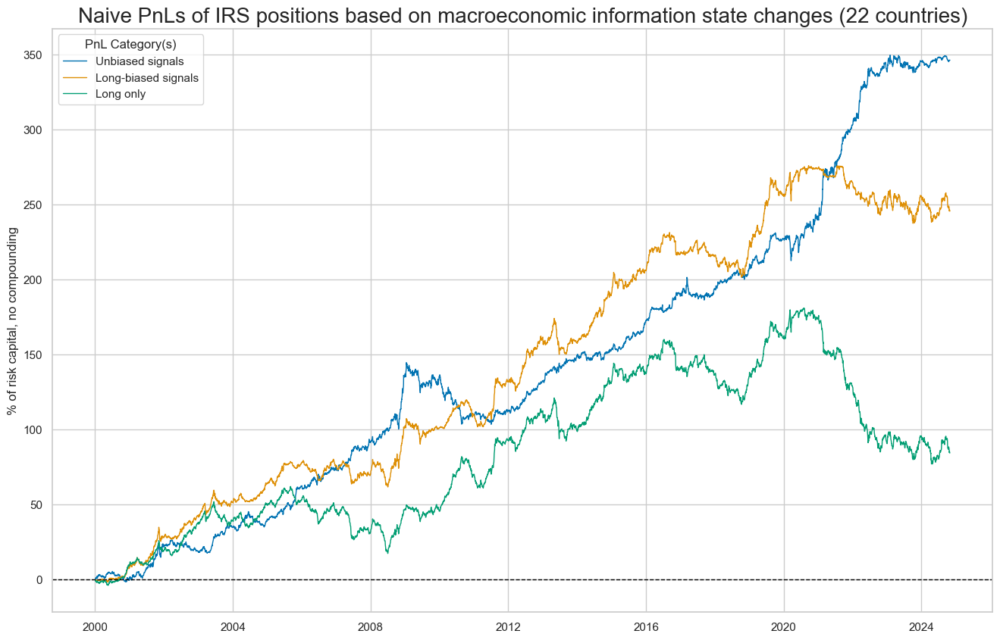

In [62]:
dix = dict_local

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN" + str(bias) for s in sigx[:1] for bias in [0,1]] + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of IRS positions based on macroeconomic information state changes (22 countries)",
    xcat_labels=["Unbiased signals", "Long-biased signals", "Long only"],
    figsize=(16, 10),
)

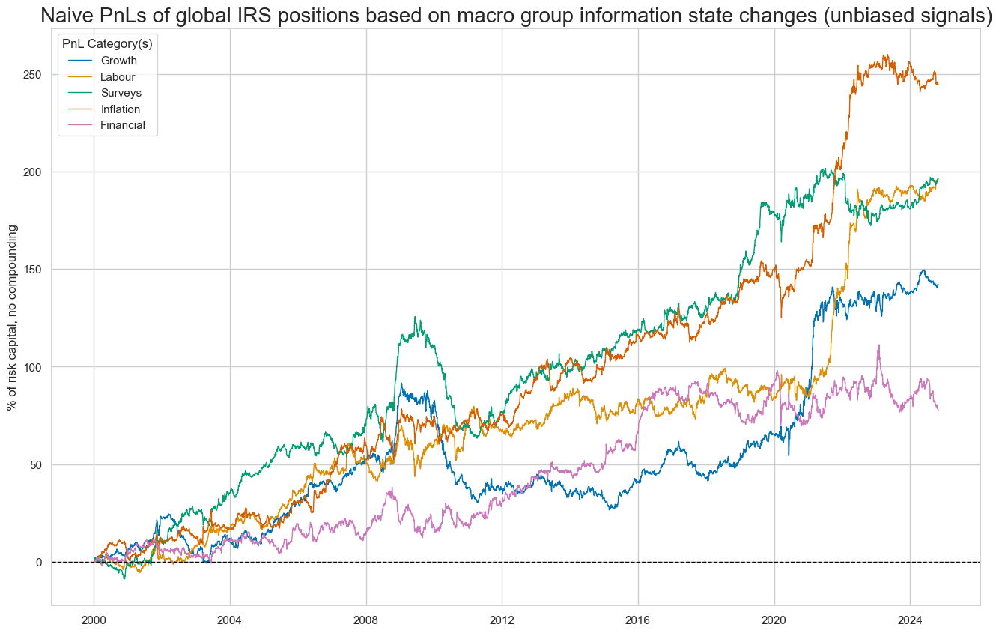

In [63]:
dix = dict_local

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN0" for s in sigx[1:]]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of global IRS positions based on macro group information state changes (unbiased signals)",
    xcat_labels=glabels_ordered[1:],
    figsize=(16, 10),
)

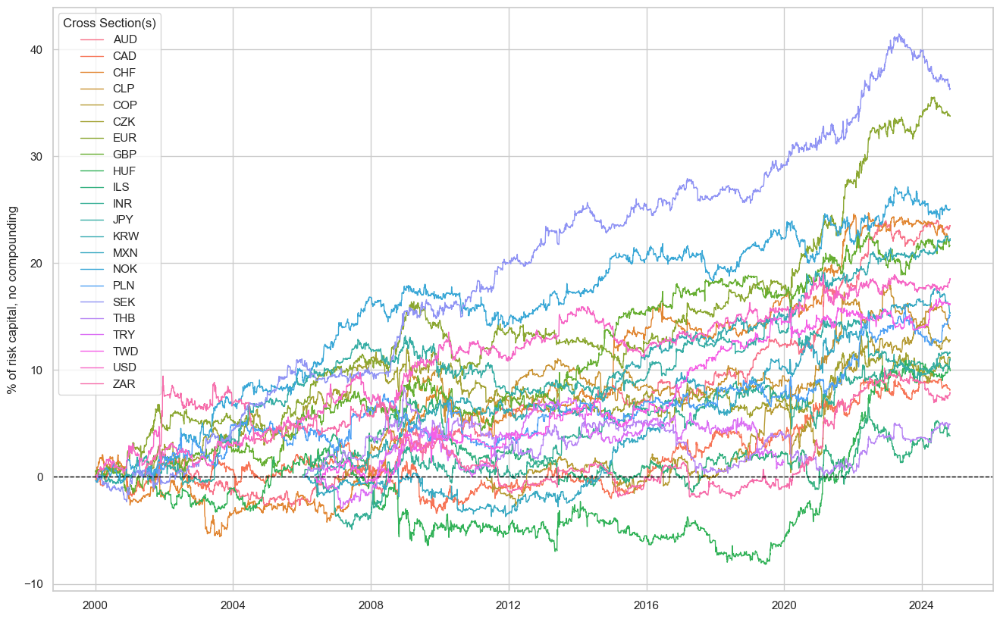

In [64]:
dix = dict_local

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN0" for s in sigx[1:]]

naive_pnl.plot_pnls(
    pnl_cats=["ALL_NICAW_3DXMS_PZN0"],
    pnl_cids=cids_du,
    start=start,
    title=None,
    xcat_labels=None,
    figsize=(16, 10),
)

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_DU05YXR_NSA correl,Traded Months
xcat,,,,,,,,,,
ALL_NICAW_3DXMS_PZN0,13.953597,10.0,1.39536,2.20858,-16.335958,-21.355854,-41.150726,0.459464,0.026586,298
ALL_NICAW_3DXMS_PZN1,9.898353,10.0,0.989835,1.455298,-16.450938,-19.276141,-38.494343,0.638016,0.511248,298
FINANCIAL_NICAW_3DXMS_PZN0,3.118539,10.0,0.311854,0.446787,-25.374759,-28.777643,-34.651849,1.356385,-0.015751,298
FINANCIAL_NICAW_3DXMS_PZN1,3.971189,10.0,0.397119,0.554171,-18.115759,-38.913228,-99.192403,1.481806,0.496237,298
GROWTH_NICAW_3DXMS_PZN0,5.729038,10.0,0.572904,0.872411,-13.669032,-34.746661,-65.186336,1.020017,0.042372,298
GROWTH_NICAW_3DXMS_PZN1,5.716771,10.0,0.571677,0.82597,-18.443251,-35.608023,-61.847446,1.018723,0.513203,298
INFLATION_NICAW_3DXMS_PZN0,9.86663,10.0,0.986663,1.495564,-21.086997,-25.382351,-29.255001,0.656651,0.014678,298
INFLATION_NICAW_3DXMS_PZN1,8.061923,10.0,0.806192,1.155069,-22.068749,-19.531088,-42.715803,0.758397,0.486954,298
LABOUR_NICAW_3DXMS_PZN0,7.930081,10.0,0.793008,1.204179,-15.353489,-22.563812,-26.257047,0.786437,-0.022983,298


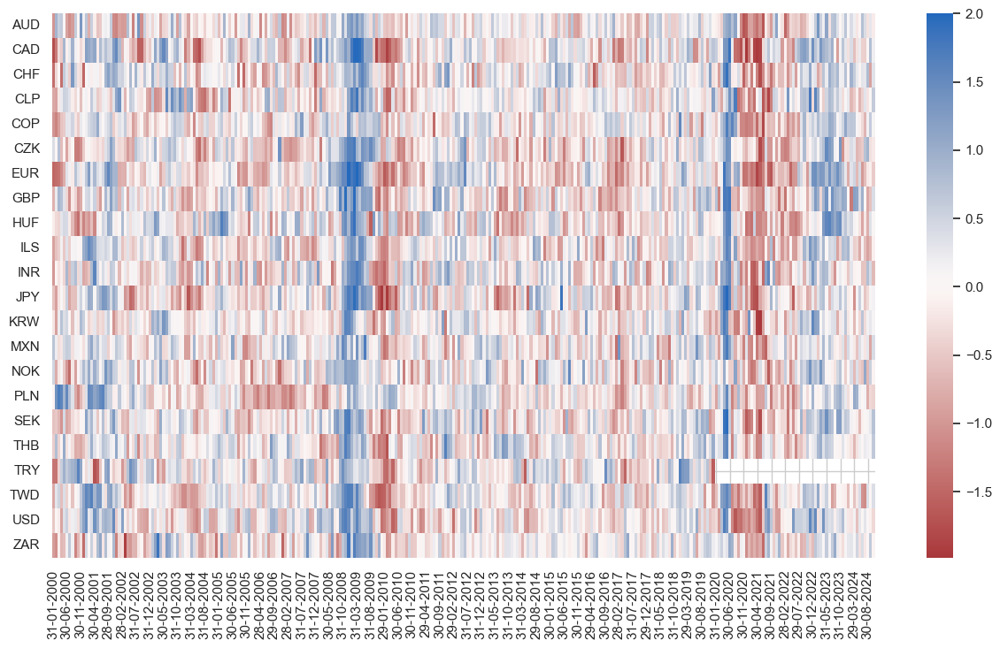

In [65]:
dix = dict_local

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN" + str(bias) for s in sigx for bias in [0, 1]] + ["Long only"]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

naive_pnl.signal_heatmap(
    pnl_name=pnls[0], 
    freq="m",
    title=None,  
    figsize=(15, 8)
)



### Local-global signals

#### Specs and panel test

In [66]:
ics_g = [i + "_LG" for i in ics]

dict_lg = {
    "sigs": ics_g,
    "targs": ["DU05YXR_NSA", "DU05YXR_VT10"],
    "cidx": cids_du,
    "start": "2000-01-01",
    "black": dublack,
    "srr": None,
    "pnls": None,
}

LABOUR_NICAW_3DXMS_LG misses: ['INR'].


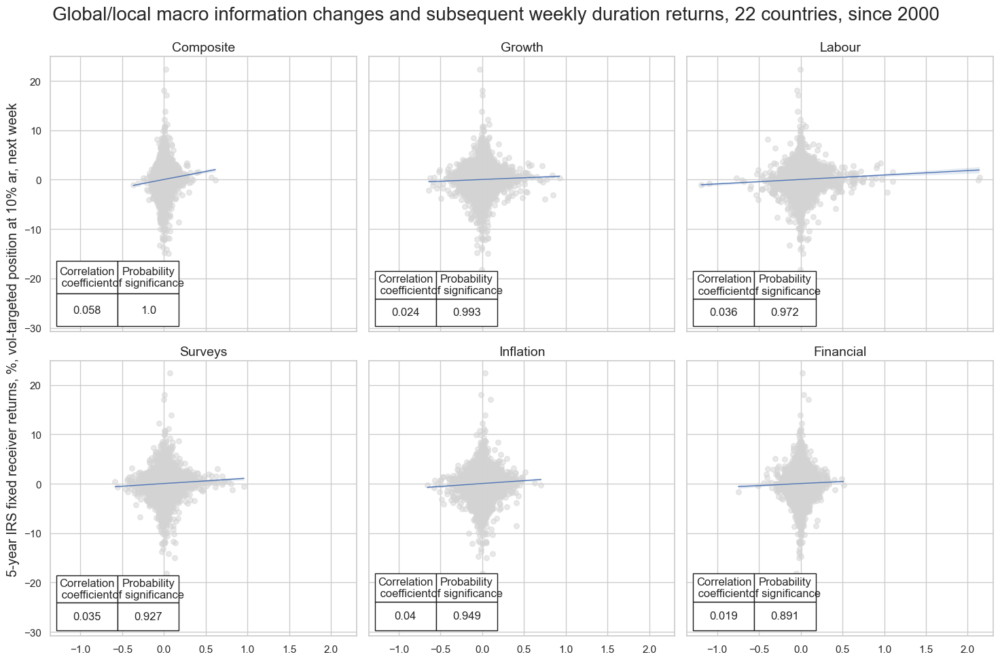

In [67]:
dix = dict_lg

sigs = dix["sigs"]
targ = dix["targs"][1] 
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="W",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Global/local macro information changes and subsequent weekly duration returns, 22 countries, since 2000",
    ylab="5-year IRS fixed receiver returns, %, vol-targeted position at 10% ar, next week",
    ncol=3,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=glabels_ordered,
)

#### Accuracy and correlation check

In [68]:
dix = dict_lg

sigx = dix["sigs"]
targx = [dix["targs"][1]]
cidx = dix["cidx"]
start = dix["start"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    sig_neg=[False] * len(sigx),
    freqs="D",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [69]:
dix = dict_lg
srr = dix["srr"]
display(srr.multiple_relations_table().astype("float").round(3))

accuracy  \
Return       Signal                   Frequency Aggregation             
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last            0.508   
             FINANCIAL_NICAW_3DXMS_LG D         last            0.500   
             GROWTH_NICAW_3DXMS_LG    D         last            0.502   
             INFLATION_NICAW_3DXMS_LG D         last            0.507   
             LABOUR_NICAW_3DXMS_LG    D         last            0.501   
             SURVEYS_NICAW_3DXMS_LG   D         last            0.506   

                                                             bal_accuracy  \
Return       Signal                   Frequency Aggregation                 
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last                0.510   
             FINANCIAL_NICAW_3DXMS_LG D         last                0.501   
             GROWTH_NICAW_3DXMS_LG    D         last                0.501   
             INFLATION_NICAW_3DXMS_LG D         last                0.507   
             LABOUR_NICAW_3DXMS_LG    D         last                0.506   
             SURVEYS_NICAW_3DXMS_LG   D         last                0.507   

                                                             pos_sigr  \
Return       Signal                   Frequency Aggregation             
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last            0.474   
             FINANCIAL_NICAW_3DXMS_LG D         last            0.480   
             GROWTH_NICAW_3DXMS_LG    D         last            0.521   
             INFLATION_NICAW_3DXMS_LG D         last            0.498   
             LABOUR_NICAW_3DXMS_LG    D         last            0.414   
             SURVEYS_NICAW_3DXMS_LG   D         last            0.490   

                                                             pos_retr  \
Return       Signal                   Frequency Aggregation             
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last            0.527   
             FINANCIAL_NICAW_3DXMS_LG D         last            0.526   
             GROWTH_NICAW_3DXMS_LG    D         last            0.527   
             INFLATION_NICAW_3DXMS_LG D         last            0.527   
             LABOUR_NICAW_3DXMS_LG    D         last            0.529   
             SURVEYS_NICAW_3DXMS_LG   D         last            0.527   

                                                             pos_prec  \
Return       Signal                   Frequency Aggregation             
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last            0.537   
             FINANCIAL_NICAW_3DXMS_LG D         last            0.528   
             GROWTH_NICAW_3DXMS_LG    D         last            0.528   
             INFLATION_NICAW_3DXMS_LG D         last            0.534   
             LABOUR_NICAW_3DXMS_LG    D         last            0.536   
             SURVEYS_NICAW_3DXMS_LG   D         last            0.534   

                                                             neg_prec  \
Return       Signal                   Frequency Aggregation             
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last            0.482   
             FINANCIAL_NICAW_3DXMS_LG D         last            0.475   
             GROWTH_NICAW_3DXMS_LG    D         last            0.474   
             INFLATION_NICAW_3DXMS_LG D         last            0.480   
             LABOUR_NICAW_3DXMS_LG    D         last            0.476   
             SURVEYS_NICAW_3DXMS_LG   D         last            0.480   

                                                             pearson  \
Return       Signal                   Frequency Aggregation            
DU05YXR_VT10 ALL_NICAW_3DXMS_LG       D         last           0.034   
             FINANCIAL_NICAW_3DXMS_LG D         last           0.003   
             GROWTH_NICAW_3DXMS_LG    D         last           0.016   
             INFLATION_NICAW_3DXMS_LG D         last           0.028   
             LABOUR_NICAW_3DXMS_LG    D         last           0.020   
             SU

#### Naive PnL

In [70]:
dix = dict_lg

sigx = dix["sigs"]
targ = dix["targs"][1]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

dfxx = dfx[["real_date", "cid", "xcat", "value"]]

naive_pnl = msn.NaivePnL(
    dfxx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_DU05YXR_NSA"],
)

for sig in sigx:
    for bias in [0, 1]:
        naive_pnl.make_pnl(
            sig,
            sig_neg=False,
            sig_op='zn_score_pan',
            sig_add=bias,
            thresh=2,
            rebal_freq="daily",
            vol_scale=10,
            rebal_slip=1,
            pnl_name=sig+"_PZN" + str(bias)
        )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = naive_pnl

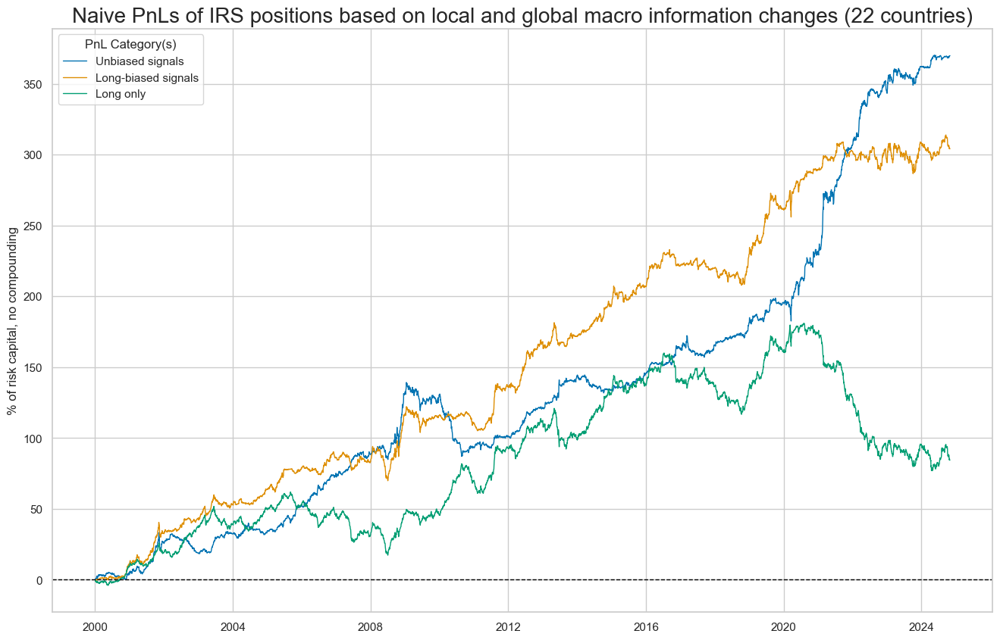

In [71]:
dix = dict_lg

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN" + str(bias) for s in sigx[:1] for bias in [0,1]] + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of IRS positions based on local and global macro information changes (22 countries)",
    xcat_labels=["Unbiased signals", "Long-biased signals", "Long only"],
    figsize=(16, 10),
)

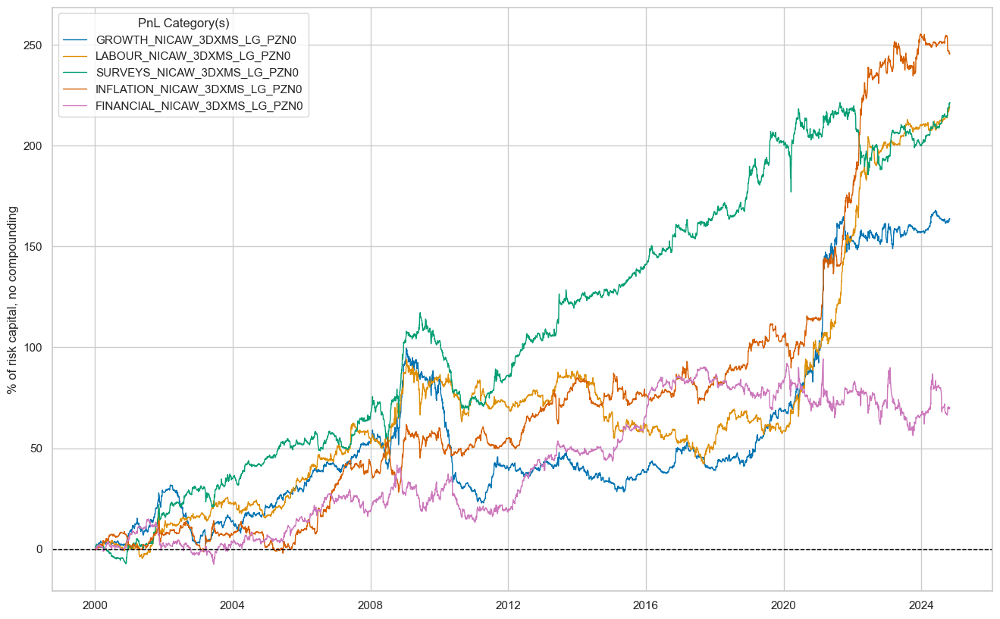

In [72]:
dix = dict_lg

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN0" for s in sigx[1:]]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title=None,
    xcat_labels=None,
    figsize=(16, 10),
)

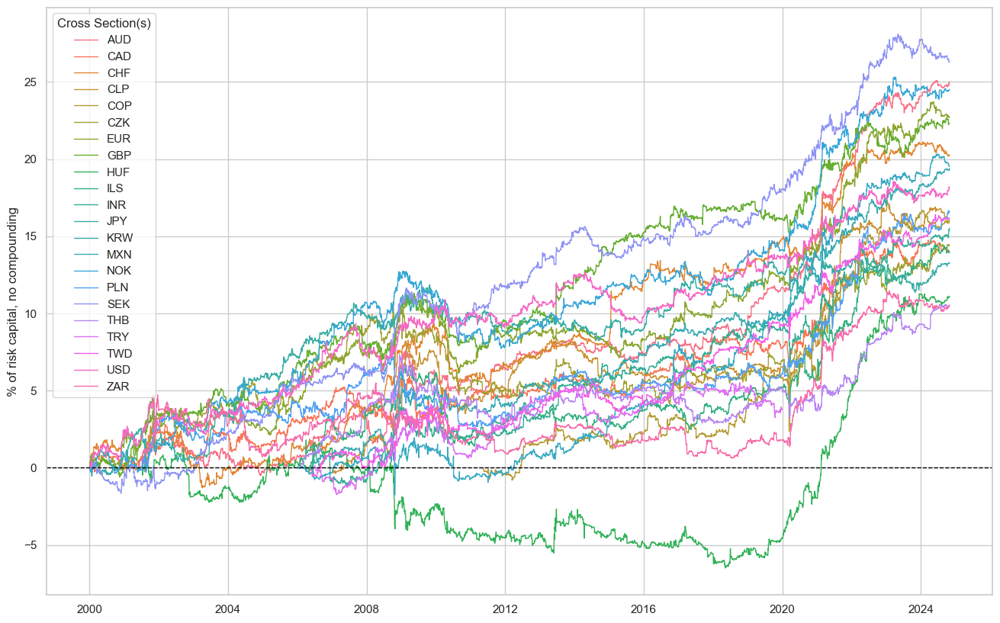

In [73]:
dix = dict_lg

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

naive_pnl.plot_pnls(
    pnl_cats=["ALL_NICAW_3DXMS_LG_PZN0"],
    pnl_cids=cids_du,
    start=start,
    title=None,
    xcat_labels=None,
    figsize=(16, 10),
)

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_DU05YXR_NSA correl,Traded Months
xcat,,,,,,,,,,
ALL_NICAW_3DXMS_LG_PZN0,14.906857,10.0,1.490686,2.497836,-14.403872,-33.015671,-52.172818,0.495357,0.033704,298
ALL_NICAW_3DXMS_LG_PZN1,12.255711,10.0,1.225571,1.88358,-14.190356,-18.114286,-25.062672,0.543717,0.470988,298
FINANCIAL_NICAW_3DXMS_LG_PZN0,2.825407,10.0,0.282541,0.402349,-17.938011,-25.838081,-38.035743,1.543662,0.004016,298
FINANCIAL_NICAW_3DXMS_LG_PZN1,4.498172,10.0,0.449817,0.631217,-17.438893,-42.354879,-102.587285,1.322724,0.459685,298
GROWTH_NICAW_3DXMS_LG_PZN0,6.59319,10.0,0.659319,1.04164,-17.853693,-49.855505,-76.652691,1.019309,0.048329,298
GROWTH_NICAW_3DXMS_LG_PZN1,6.222127,10.0,0.622213,0.913634,-17.934823,-37.615203,-63.685771,1.000322,0.477298,298
INFLATION_NICAW_3DXMS_LG_PZN0,9.891651,10.0,0.989165,1.589311,-14.487484,-19.24063,-27.123878,0.839074,0.014171,298
INFLATION_NICAW_3DXMS_LG_PZN1,9.31941,10.0,0.931941,1.362069,-20.553388,-18.139072,-26.495349,0.723817,0.429537,298
LABOUR_NICAW_3DXMS_LG_PZN0,8.832075,10.0,0.883208,1.369877,-19.372927,-21.010886,-51.859562,0.714039,-0.024294,298


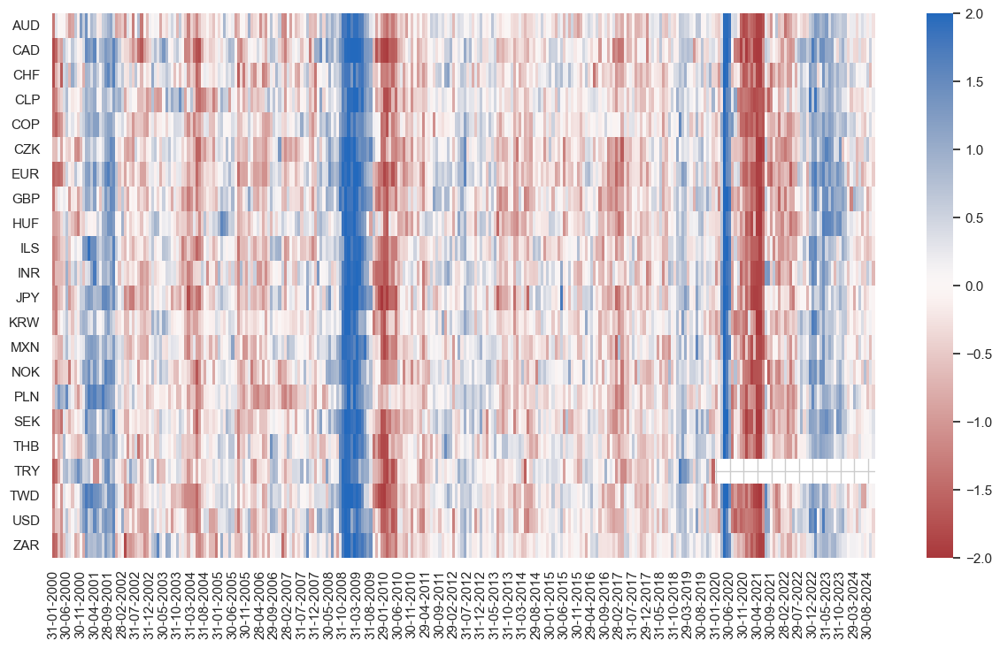

In [74]:
dix = dict_lg

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN" + str(bias) for s in sigx for bias in [0, 1]] + ["Long only"]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

naive_pnl.signal_heatmap(
    pnl_name=pnls[0], 
    freq="m",
    title=None,  
    figsize=(15, 8)
)